In [58]:
import warnings
warnings.filterwarnings('ignore')
import re
import math
import pickle
import plotly
import plotly.figure_factory as ff
from collections import Counter
import pandas as pd
import numpy as np
import requests
from io import BytesIO
from PIL import Image
import seaborn as sns
from scipy.sparse import hstack
import matplotlib.pyplot as plt
from matplotlib import gridspec
from sklearn.metrics import pairwise_distances
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

# Load the dataset

In [2]:
data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
43,B0079BMKDS,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,APPAREL,featherlite ladies silky smooth pique white xl,$13.53


# Bag of Words using Titles.

## Display the image

In [186]:
def display_img(url):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)

## Display the heatmap

In [187]:
def plot_heatmap(keys, values, labels, url, text):
    gs = gridspec.GridSpec(2, 2, width_ratios=[4, 1], height_ratios=[4, 1])
    fig = plt.figure(figsize=(25, 3))
    ax = plt.subplot(gs[0])
    ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
    ax.set_xticklabels(keys)
    ax.set_title(text)
    ax = plt.subplot(gs[1])
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url)
    plt.show()

## Display heatmap and image side by side

In [188]:
def plot_heatmap_image(doc_id, vec1, vec2, url, text):
    intersection = set(vec1.keys()) & set(vec2.keys())
    text = text
    for i in vec2:
        if i not in intersection:
            vec2[i] = 0
    keys = list(vec2.keys())
    values = [vec2[x] for x in vec2.keys()]
    labels = values
    plot_heatmap(keys, values, labels, url, text)

In [189]:
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    return Counter(words)

In [190]:
def get_result(doc_id, content_a, content_b, url):
    text1 = content_a
    text2 = content_b
    url = url
    vector1 = text_to_vector(text1)
    vector2 = text_to_vector(text2)
    plot_heatmap_image(doc_id, vector1, vector2, url, text2)

In [191]:
def vectorized():
    title_vectorizer = CountVectorizer()
    title_features = title_vectorizer.fit_transform(data['title'])
    return title_features

In [192]:
def bag_of_words_model(asin_number, num_results):
    data_final = data.reset_index(drop=True)
    asin_index = data_final[data_final['asin'] == asin_number].index
    if asin_number in data_final['asin'].values:
        title_features = vectorized()
        pairwise_dist = pairwise_distances(title_features, title_features[asin_index])
        indices = np.argsort(pairwise_dist.flatten())[0:num_results]
        pdists = np.sort(pairwise_dist.flatten())[0:num_results]
        df_indices = list(data_final.index[indices])
        for i in range(0, len(indices)):
            get_result(indices[i], data_final['title'].loc[df_indices[0]],
                                data_final['title'].loc[df_indices[i]], data_final['medium_image_url'].loc[df_indices[i]])
            print('ASIN :', data_final['asin'].loc[df_indices[i]])
            print('Brand:', data_final['brand'].loc[df_indices[i]])
            print('Title:', data_final['title'].loc[df_indices[i]])
            print('Euclidean similarity with the query image :', pdists[i])
            print('=' * 100)
    else:
        print('ASIN number is not in data base')

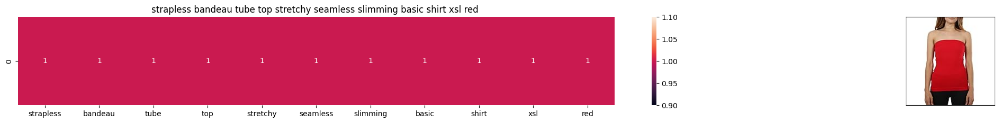

ASIN : B011FGS0N6
Brand: Ekimo
Title: strapless bandeau tube top stretchy seamless slimming basic shirt xsl red 
Euclidean similarity with the query image : 0.0


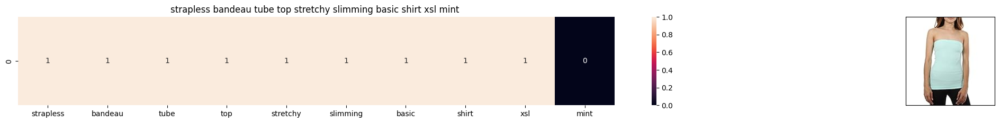

ASIN : B011FGS0RM
Brand: Ekimo
Title: strapless bandeau tube top stretchy slimming basic shirt xsl mint 
Euclidean similarity with the query image : 1.7320508075688772


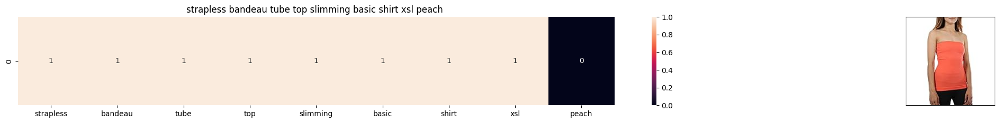

ASIN : B011FGS0RC
Brand: Ekimo
Title: strapless bandeau tube top slimming basic shirt xsl peach 
Euclidean similarity with the query image : 2.0


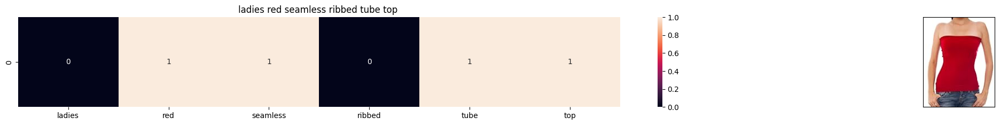

ASIN : B009286M3A
Brand: FineBrandShop
Title: ladies red seamless ribbed tube top 
Euclidean similarity with the query image : 3.0


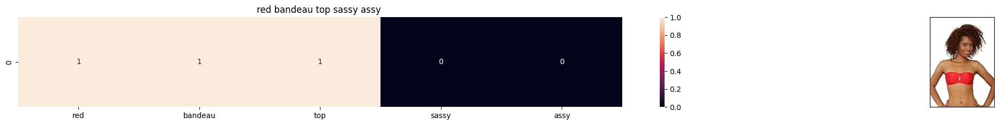

ASIN : B01G12MO8Q
Brand: Sassy Assy
Title: red bandeau top sassy assy 
Euclidean similarity with the query image : 3.1622776601683795


In [193]:
bag_of_words_model('B011FGS0N6', 5)

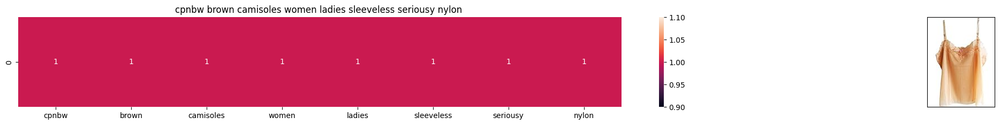

ASIN : B00NURPXK2
Brand: Nylon Camisoles-Blouse
Title: cpnbw brown camisoles women ladies sleeveless seriousy nylon 
Euclidean similarity with the query image : 0.0


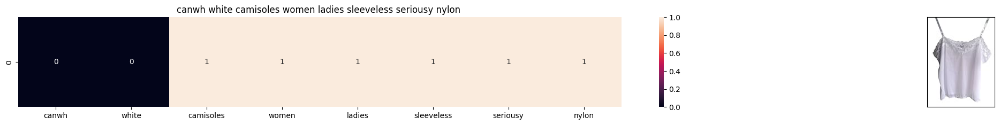

ASIN : B00NURFSYI
Brand: Nylon Camisoles-Blouse
Title: canwh white camisoles women ladies sleeveless seriousy nylon 
Euclidean similarity with the query image : 2.0


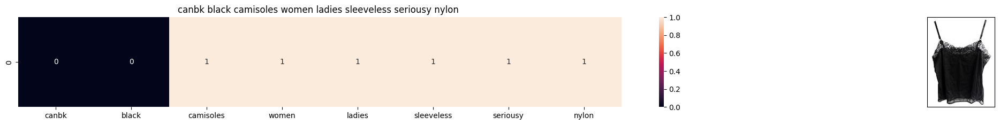

ASIN : B00NURIKMU
Brand: Nylon Camisoles-Blouse
Title: canbk black camisoles women ladies sleeveless seriousy nylon 
Euclidean similarity with the query image : 2.0


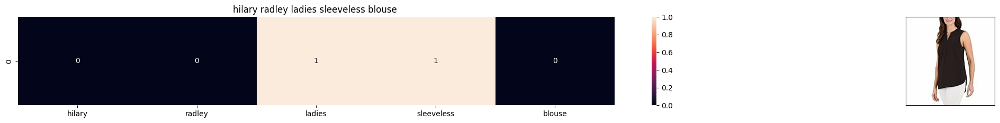

ASIN : B071JC68WH
Brand: Hilary Radley Ladies' Sleeveless Blouse
Title: hilary radley ladies sleeveless blouse 
Euclidean similarity with the query image : 3.0


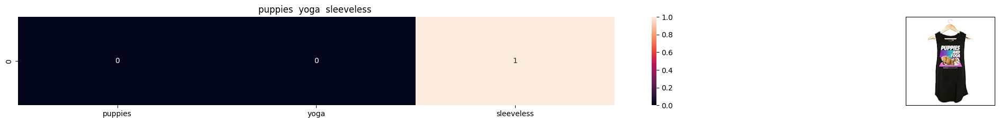

ASIN : B01G4GNH2G
Brand: Puppies Make Me Happy
Title: puppies  yoga  sleeveless 
Euclidean similarity with the query image : 3.0


In [194]:
bag_of_words_model('B00NURPXK2', 5)

In [195]:
def add_features():
    data['brand'].fillna(value="Not given", inplace=True)
    brands = [x.replace(" ", "-") for x in data['brand'].values]
    types = [x.replace(" ", "-") for x in data['product_type_name'].values]
    colors = [x.replace(" ", "-") for x in data['color'].values]

    brand_vectorizer = CountVectorizer()
    brand_features = brand_vectorizer.fit_transform(brands)

    type_vectorizer = CountVectorizer()
    type_features = type_vectorizer.fit_transform(types)

    color_vectorizer = CountVectorizer()
    color_features = color_vectorizer.fit_transform(colors)

    extra_features = hstack((brand_features, type_features, color_features)).tocsr()
    return extra_features

In [233]:
def bag_of_words_model(asin_number, num_results, w1, w2):
    data_final = data.reset_index(drop=True)
    asin_index = data_final[data_final['asin'] == asin_number].index
    if asin_number in data_final['asin'].values:
        title_features = vectorized()
        extra_features = add_features()
        idf_w2v_dist = pairwise_distances(title_features, title_features[asin_index].reshape(1, -1))
        ex_feat_dist = pairwise_distances(extra_features, extra_features[asin_index])
        pairwise_dist = (w1 * idf_w2v_dist + w2 * ex_feat_dist) / float(w1 + w2)
        indices = np.argsort(pairwise_dist.flatten())[0:num_results]
        pdists = np.sort(pairwise_dist.flatten())[0:num_results]
        df_indices = list(data_final.index[indices])
        for i in range(0, len(indices)):
            get_result(indices[i], data_final['title'].loc[df_indices[0]],
                                data_final['title'].loc[df_indices[i]], data_final['medium_image_url'].loc[df_indices[i]])
            print('ASIN :', data_final['asin'].loc[df_indices[i]])
            print('Brand:', data_final['brand'].loc[df_indices[i]])
            print('Color: ', data_final['color'].loc[df_indices[i]])
            print('Title:', data_final['title'].loc[df_indices[i]])
            print('Euclidean similarity with the query image :', pdists[i])
            print('=' * 100)
    else:
        print('ASIN number is not in data base')

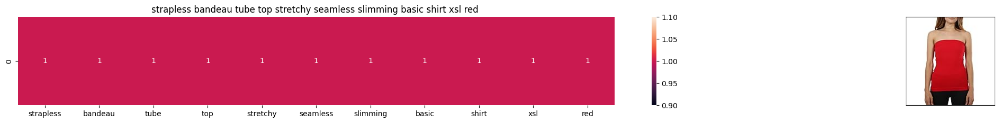

ASIN : B011FGS0N6
Brand: Ekimo
Color:  Red
Title: strapless bandeau tube top stretchy seamless slimming basic shirt xsl red 
Euclidean similarity with the query image : 0.0


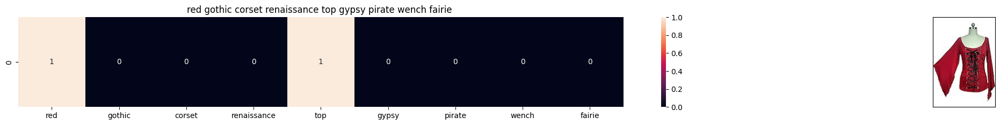

ASIN : B017Y6AC3W
Brand: C & S
Color:  Red
Title: red gothic corset renaissance top gypsy pirate wench fairie 
Euclidean similarity with the query image : 1.3


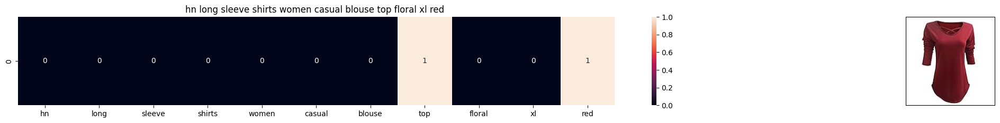

ASIN : B0711KH9DX
Brand: H&N
Color:  Red
Title: hn long sleeve shirts women casual blouse top floral xl red 
Euclidean similarity with the query image : 1.3242640687119285


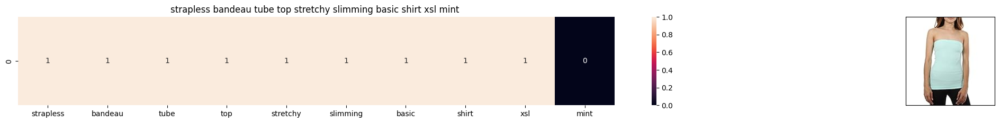

ASIN : B011FGS0RM
Brand: Ekimo
Color:  Mint
Title: strapless bandeau tube top stretchy slimming basic shirt xsl mint 
Euclidean similarity with the query image : 1.4459972868926734


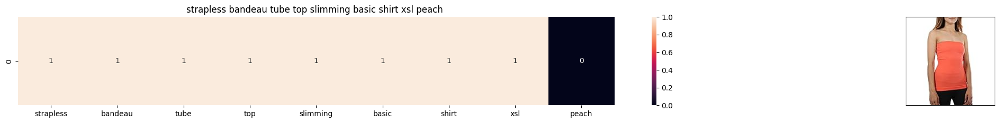

ASIN : B011FGS0RC
Brand: Ekimo
Color:  Peach
Title: strapless bandeau tube top slimming basic shirt xsl peach 
Euclidean similarity with the query image : 1.4727922061357857


In [236]:
bag_of_words_model('B011FGS0N6', 5, 1, 9)

# Term frequency Inverse document Frequency(TF-IDF) using Titles

In [32]:
def plot_heatmap_image(doc_id, vec1, vec2, url, text, title_vectorizer, title_features):
    intersection = set(vec1.keys()) & set(vec2.keys())
    for i in vec2:
        if i not in intersection:
            vec2[i] = 0
    keys = list(vec2.keys())
    values = [vec2[x] for x in vec2.keys()]
    labels = []
    for x in vec2.keys():
        if x in title_vectorizer.vocabulary_:
            labels.append(title_features[doc_id, title_vectorizer.vocabulary_[x]])
        else:
            labels.append(0)

    plot_heatmap(keys, values, labels, url, text)

In [33]:
def get_result(doc_id, content_a, content_b, url, title_vectorizer, title_features):
    text1 = content_a
    text2 = content_b
    url = url
    vector1 = text_to_vector(text1)
    vector2 = text_to_vector(text2)
    plot_heatmap_image(doc_id, vector1, vector2, url, text2, title_vectorizer, title_features)

In [34]:
def vectorized():
    title_vectorizer = TfidfVectorizer(min_df=0.0)
    title_features = title_vectorizer.fit_transform(data['title'])
    return title_vectorizer, title_features

In [35]:
def TF_IDF_words_model(asin_number, num_results):
    data_final = data.reset_index(drop=True)
    asin_index = data_final[data_final['asin'] == asin_number].index
    if asin_number in data_final['asin'].values:
        title_vectorizer, title_features = vectorized()
        pairwise_dist = pairwise_distances(title_features, title_features[asin_index])
        indices = np.argsort(pairwise_dist.flatten())[0:num_results]
        pdists = np.sort(pairwise_dist.flatten())[0:num_results]
        df_indices = list(data_final.index[indices])
        for i in range(0, len(indices)):
            get_result(indices[i], data_final['title'].loc[df_indices[0]],
                                data_final['title'].loc[df_indices[i]], data_final['medium_image_url'].loc[df_indices[i]], title_vectorizer, title_features)
            print('ASIN :', data_final['asin'].loc[df_indices[i]])
            print('Brand:', data_final['brand'].loc[df_indices[i]])
            print('Title:', data_final['title'].loc[df_indices[i]])
            print('Euclidean similarity with the query image :', pdists[i])
            print('=' * 100)
    else:
        print('ASIN number is not in data base')

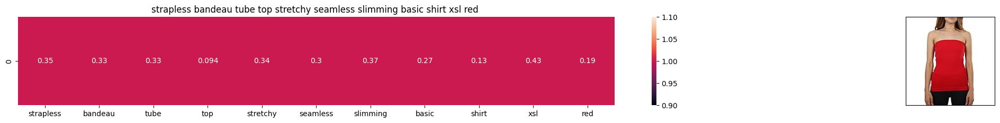

ASIN : B011FGS0N6
Brand: Ekimo
Title: strapless bandeau tube top stretchy seamless slimming basic shirt xsl red 
Euclidean similarity with the query image : 0.0


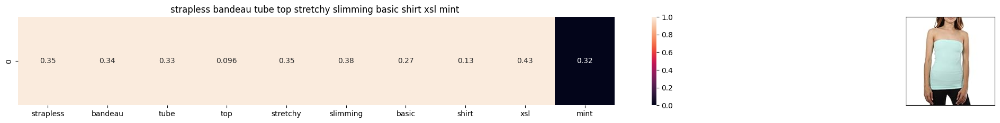

ASIN : B011FGS0RM
Brand: Ekimo
Title: strapless bandeau tube top stretchy slimming basic shirt xsl mint 
Euclidean similarity with the query image : 0.4735199883980016


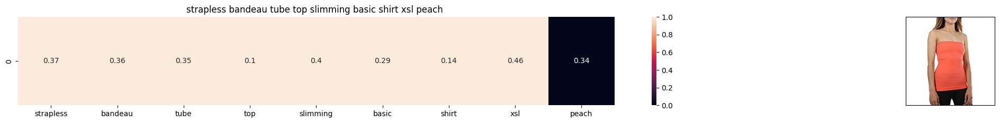

ASIN : B011FGS0RC
Brand: Ekimo
Title: strapless bandeau tube top slimming basic shirt xsl peach 
Euclidean similarity with the query image : 0.5998826485774882


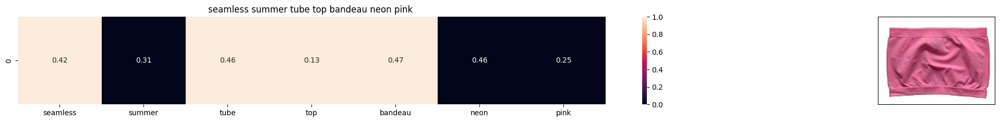

ASIN : B000OF2PFE
Brand: Fornia
Title: seamless summer tube top bandeau neon pink 
Euclidean similarity with the query image : 1.052747001640281


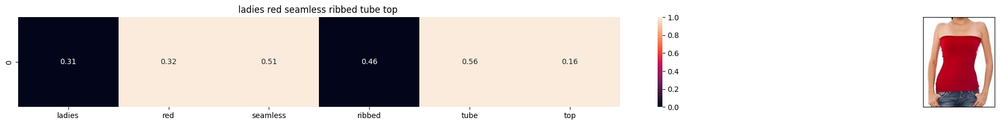

ASIN : B009286M3A
Brand: FineBrandShop
Title: ladies red seamless ribbed tube top 
Euclidean similarity with the query image : 1.0867568391388192


In [36]:
TF_IDF_words_model('B011FGS0N6', 5)

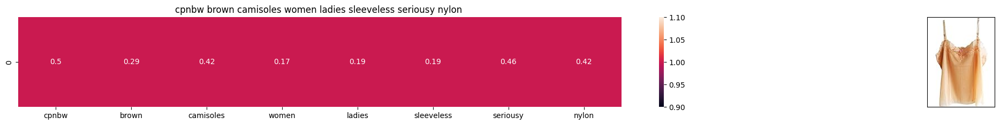

ASIN : B00NURPXK2
Brand: Nylon Camisoles-Blouse
Title: cpnbw brown camisoles women ladies sleeveless seriousy nylon 
Euclidean similarity with the query image : 0.0


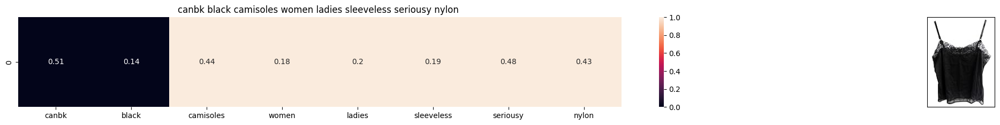

ASIN : B00NURIKMU
Brand: Nylon Camisoles-Blouse
Title: canbk black camisoles women ladies sleeveless seriousy nylon 
Euclidean similarity with the query image : 0.7849808997972444


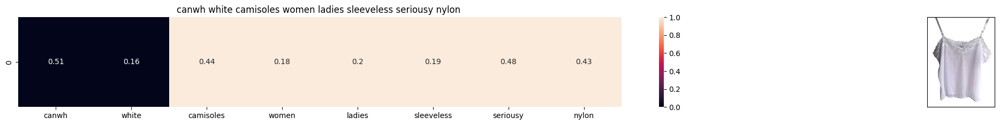

ASIN : B00NURFSYI
Brand: Nylon Camisoles-Blouse
Title: canwh white camisoles women ladies sleeveless seriousy nylon 
Euclidean similarity with the query image : 0.7864623108579568


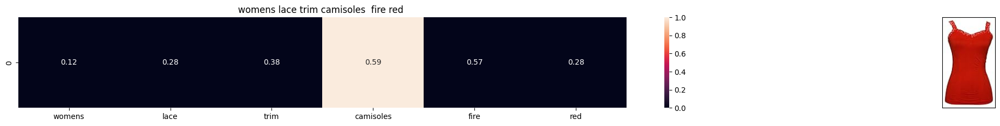

ASIN : B00JPOYON6
Brand: Contemporary Edge
Title: womens lace trim camisoles  fire red 
Euclidean similarity with the query image : 1.2236605233569997


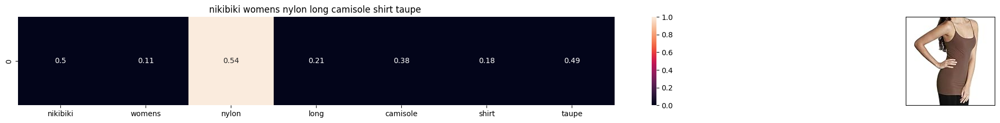

ASIN : B00OSRQXRU
Brand: Nikibiki
Title: nikibiki womens nylon long camisole shirt taupe 
Euclidean similarity with the query image : 1.2459776717914242


In [37]:
TF_IDF_words_model('B00NURPXK2', 5)

## Inverse Document Frequency(IDF) using Titles.

In [39]:
def n_containing(word):
    # return the number of documents which had the given word
    return sum(1 for blob in data['title'] if word in blob.split())

In [40]:
def idf(word):
    # idf = log(#number of docs / #number of docs which had the given word)
    return math.log(data.shape[0] / (n_containing(word)))

In [44]:
def vectorized():
    title_vectorizer = TfidfVectorizer(min_df=0.0)
    title_features = title_vectorizer.fit_transform(data['title'])
    for i in title_vectorizer.vocabulary_.keys():
        idf_val = idf(i)
        for j in title_features[:, title_vectorizer.vocabulary_[i]].nonzero()[0]:
            title_features[j, title_vectorizer.vocabulary_[i]] = idf_val
    return title_vectorizer, title_features

In [45]:
def IDF_words_model(asin_number, num_results):
    data_final = data.reset_index(drop=True)
    asin_index = data_final[data_final['asin'] == asin_number].index
    if asin_number in data_final['asin'].values:
        title_vectorizer, title_features = vectorized()
        pairwise_dist = pairwise_distances(title_features, title_features[asin_index])
        indices = np.argsort(pairwise_dist.flatten())[0:num_results]
        pdists = np.sort(pairwise_dist.flatten())[0:num_results]
        df_indices = list(data_final.index[indices])
        for i in range(0, len(indices)):
            get_result(indices[i], data_final['title'].loc[df_indices[0]],
                                data_final['title'].loc[df_indices[i]], data_final['medium_image_url'].loc[df_indices[i]], title_vectorizer, title_features)
            print('ASIN :', data_final['asin'].loc[df_indices[i]])
            print('Brand:', data_final['brand'].loc[df_indices[i]])
            print('Title:', data_final['title'].loc[df_indices[i]])
            print('Euclidean similarity with the query image :', pdists[i])
            print('=' * 100)
    else:
        print('ASIN number is not in data base')

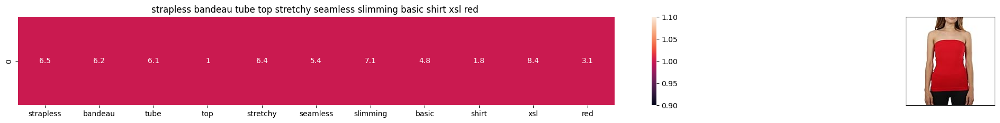

ASIN : B011FGS0N6
Brand: Ekimo
Title: strapless bandeau tube top stretchy seamless slimming basic shirt xsl red 
Euclidean similarity with the query image : 0.0


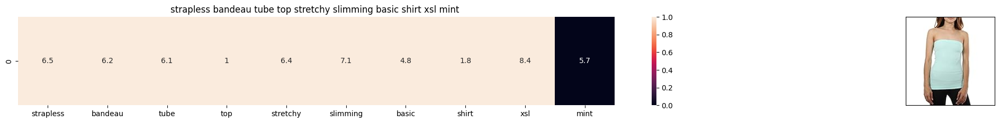

ASIN : B011FGS0RM
Brand: Ekimo
Title: strapless bandeau tube top stretchy slimming basic shirt xsl mint 
Euclidean similarity with the query image : 8.455693895867443


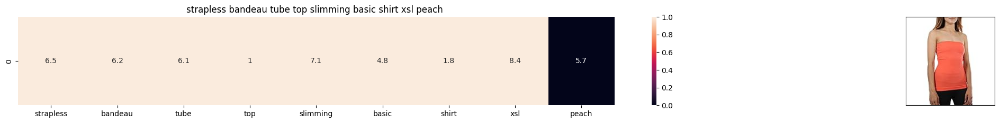

ASIN : B011FGS0RC
Brand: Ekimo
Title: strapless bandeau tube top slimming basic shirt xsl peach 
Euclidean similarity with the query image : 10.607967325285758


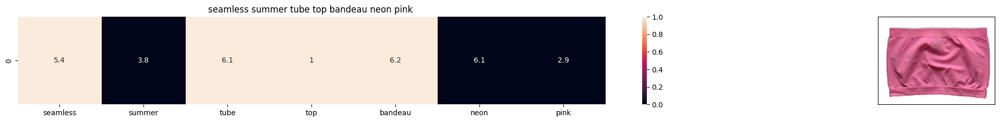

ASIN : B000OF2PFE
Brand: Fornia
Title: seamless summer tube top bandeau neon pink 
Euclidean similarity with the query image : 17.289690260493906


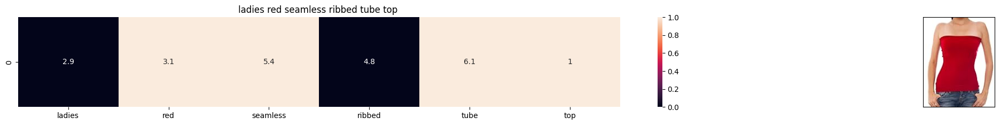

ASIN : B009286M3A
Brand: FineBrandShop
Title: ladies red seamless ribbed tube top 
Euclidean similarity with the query image : 17.331902915190717


In [48]:
IDF_words_model('B011FGS0N6', 5)

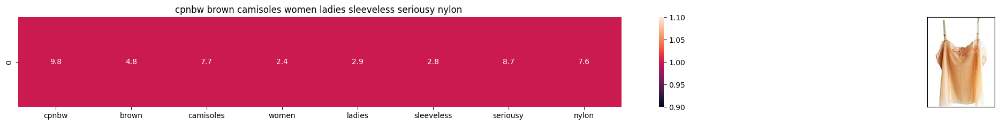

ASIN : B00NURPXK2
Brand: Nylon Camisoles-Blouse
Title: cpnbw brown camisoles women ladies sleeveless seriousy nylon 
Euclidean similarity with the query image : 0.0


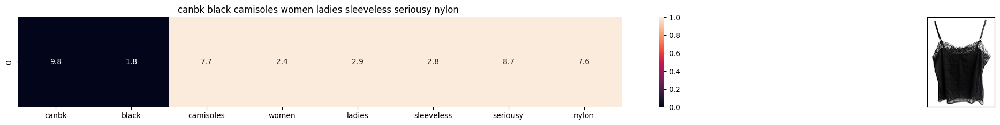

ASIN : B00NURIKMU
Brand: Nylon Camisoles-Blouse
Title: canbk black camisoles women ladies sleeveless seriousy nylon 
Euclidean similarity with the query image : 14.757633423302247


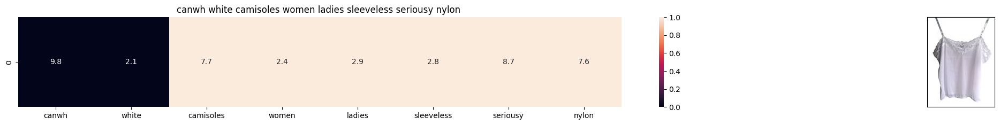

ASIN : B00NURFSYI
Brand: Nylon Camisoles-Blouse
Title: canwh white camisoles women ladies sleeveless seriousy nylon 
Euclidean similarity with the query image : 14.786671266176416


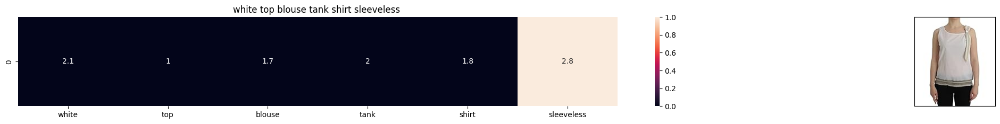

ASIN : B074G5G5RK
Brand: ERMANNO SCERVINO
Title: white top blouse tank shirt sleeveless 
Euclidean similarity with the query image : 18.44888925756795


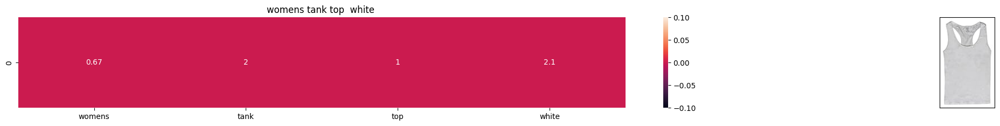

ASIN : B00JPOZ9GM
Brand: Sofra
Title: womens tank top  white 
Euclidean similarity with the query image : 18.5084022139114


In [49]:
IDF_words_model('B00NURPXK2', 5)

## Average Word to Vec using Titles.

In [167]:
# -- coding: UTF-8 --
"""
Convert text into audio.
====================================
"""
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle
import requests
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
import seaborn as sns
import pandas as pd
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
import numpy as np


class Recommendation_avg_word2vec:
    def __init__(self, asin, num_results):
        self.vocab = None
        self.model = None
        self.w2v_title = []
        self.data = pd.read_pickle(
            '/home/shobot/Desktop/Project pro/Amazon Product Reviews/pickels/16k_apperal_data_preprocessed')
        self.asin = asin
        self.num_results = num_results

    def display_img(self, url, ax, fig):
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        plt.imshow(img)

    def get_distance(self, vec1, vec2):
        final_dist = []
        for i in vec1:
            dist = []
            for j in vec2:
                dist.append(np.linalg.norm(i - j))
            final_dist.append(np.array(dist))
        return np.array(final_dist)

    def get_word_vec(self, sentence, doc_id, m_name):
        vec = []
        for i in sentence.split():
            if i in self.vocab:
                vec.append(self.model[i])
            else:
                vec.append(np.zeros(shape=(300,)))
        return np.array(vec)

    def build_avg_vec(self, sentence, num_features, doc_id, m_name):

        featureVec = np.zeros((num_features,), dtype="float32")
        nwords = 0
        for word in sentence.split():
            nwords += 1
            if word in self.vocab:
                featureVec = np.add(featureVec, self.model[word])
        if nwords > 0:
            featureVec = np.divide(featureVec, nwords)
        return featureVec

    def heat_map_w2v(self, sentence1, sentence2, url, doc_id1, doc_id2, model):
        s1_vec = self.get_word_vec(sentence1, doc_id1, model)
        s2_vec = self.get_word_vec(sentence2, doc_id2, model)
        s1_s2_dist = self.get_distance(s1_vec, s2_vec)
        gs = gridspec.GridSpec(2, 2, width_ratios=[4, 1], height_ratios=[2, 1])
        fig = plt.figure(figsize=(15, 15))
        ax = plt.subplot(gs[0])
        ax = sns.heatmap(np.round(s1_s2_dist, 4), annot=True)
        ax.set_xticklabels(sentence2.split(), rotation= 'vertical')
        ax.set_yticklabels(sentence1.split(), rotation= 'horizontal')
        ax.set_title(sentence2)

        ax = plt.subplot(gs[1])
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        self.display_img(url, ax, fig)

        plt.show()

    def avg_w2v_model(self):
        self.data = self.data.reset_index(drop=True)
        self.asin_index = self.data[self.data['asin'] == self.asin].index
        doc_id = 0
        with open('/home/shobot/Desktop/Project pro/Amazon Product Reviews/word2vec_model', 'rb') as f:
            self.model = pickle.load(f)
        self.vocab = self.model.keys()
        for i in self.data['title']:
            self.w2v_title.append(self.build_avg_vec(i, 300, doc_id, 'avg'))
            doc_id += 1
        self.w2v_title = np.array(self.w2v_title)
        pairwise_dist = pairwise_distances(self.w2v_title, self.w2v_title[self.asin_index].reshape(1, -1))
        indices = np.argsort(pairwise_dist.flatten())[0:self.num_results]
        pdists = np.sort(pairwise_dist.flatten())[0:self.num_results]
        df_indices = list(self.data.index[indices])

        for i in range(0, len(indices)):
            self.heat_map_w2v(self.data['title'].loc[df_indices[0]], self.data['title'].loc[df_indices[i]],
                              self.data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
            print('ASIN :', self.data['asin'].loc[df_indices[i]])
            print('BRAND :', self.data['brand'].loc[df_indices[i]])
            print('euclidean distance from given input image :', pdists[i])
            print('=' * 100)




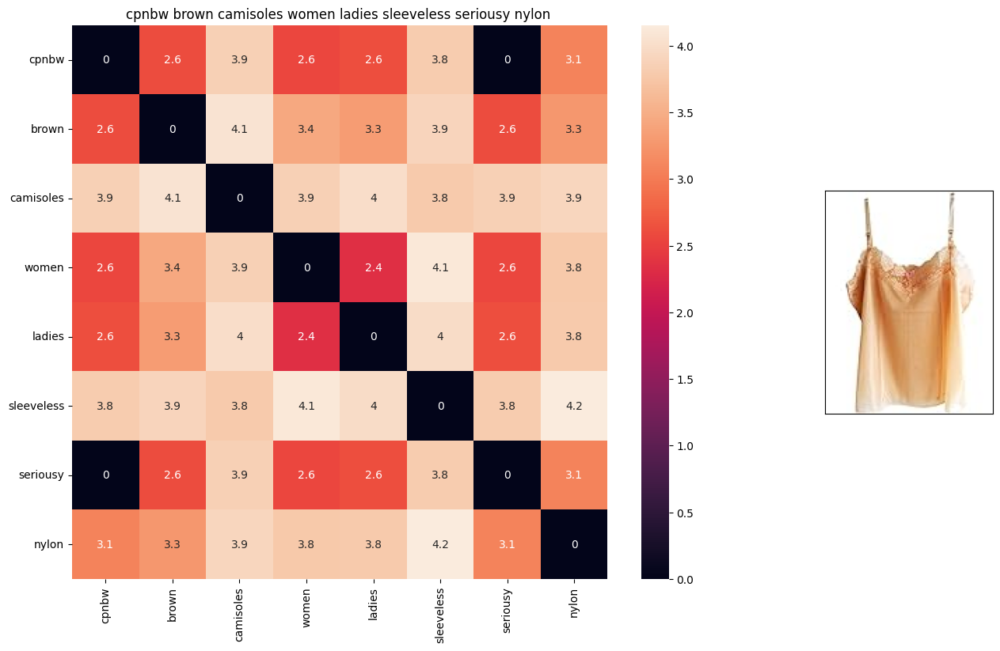

ASIN : B00NURPXK2
BRAND : Nylon Camisoles-Blouse
euclidean distance from given input image : 0.0


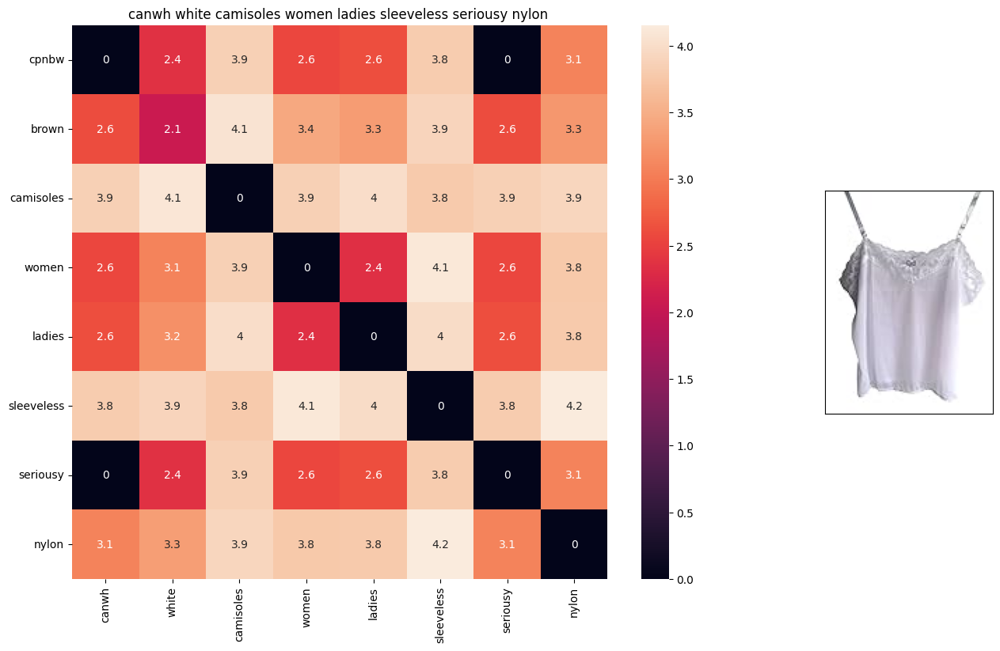

ASIN : B00NURFSYI
BRAND : Nylon Camisoles-Blouse
euclidean distance from given input image : 0.25825372


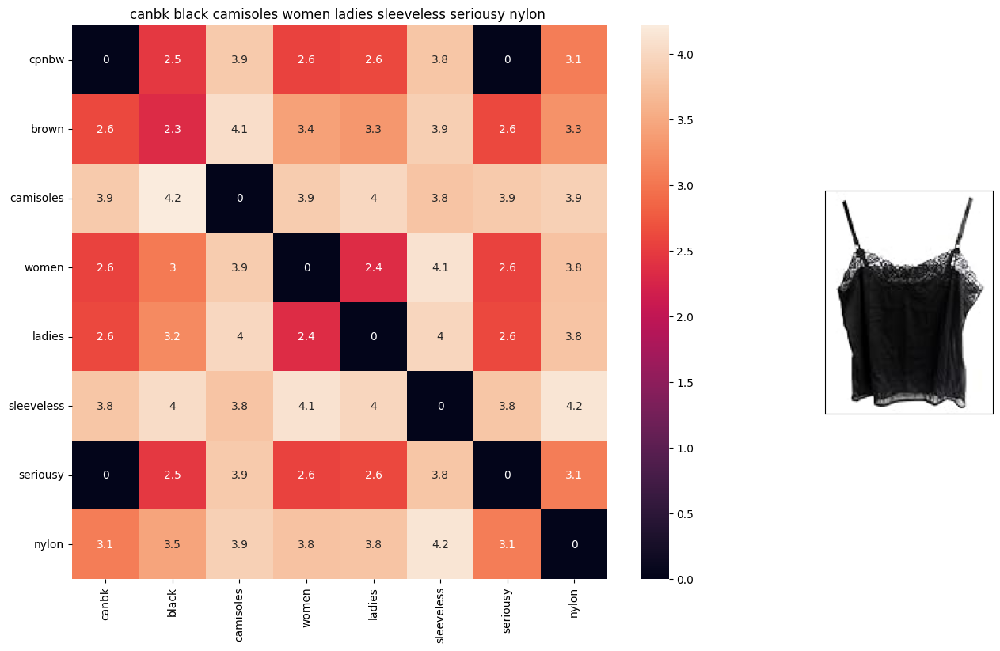

ASIN : B00NURIKMU
BRAND : Nylon Camisoles-Blouse
euclidean distance from given input image : 0.29220176


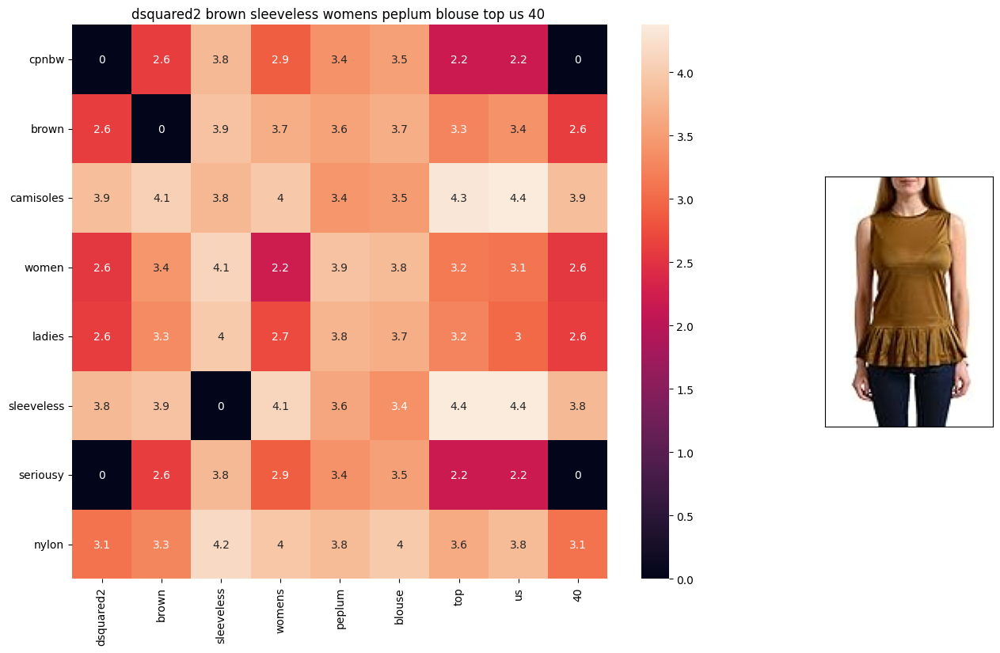

ASIN : B01EG15FVC
BRAND : DSQUARED2
euclidean distance from given input image : 0.77998585


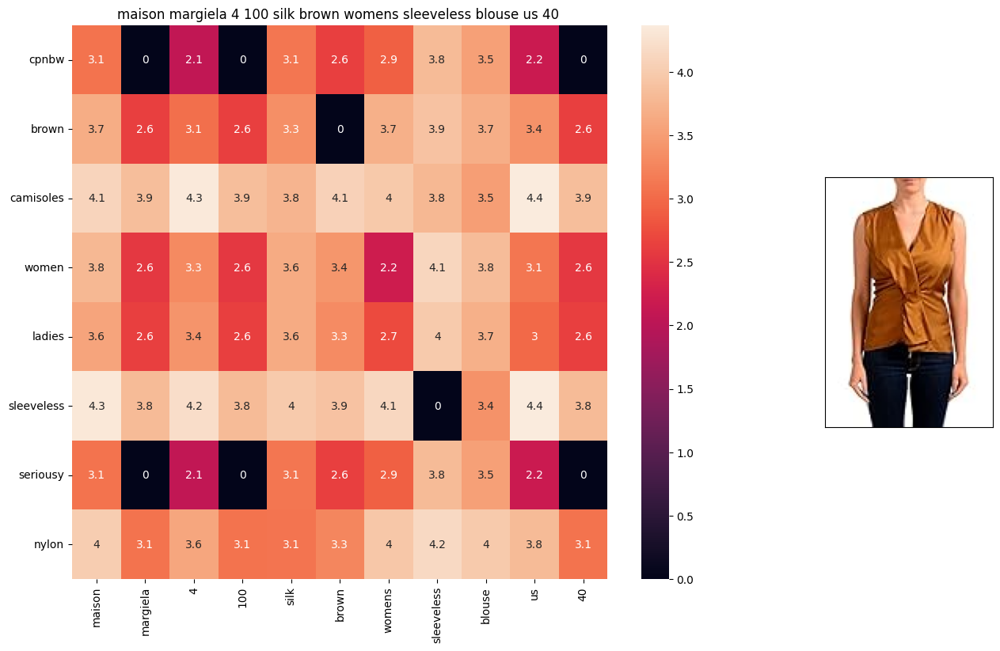

ASIN : B074FW26VT
BRAND : Maison Margiela
euclidean distance from given input image : 0.7943699


In [168]:
recommendation = Recommendation_avg_word2vec('B00NURPXK2', 5)
recommendation.avg_w2v_model()

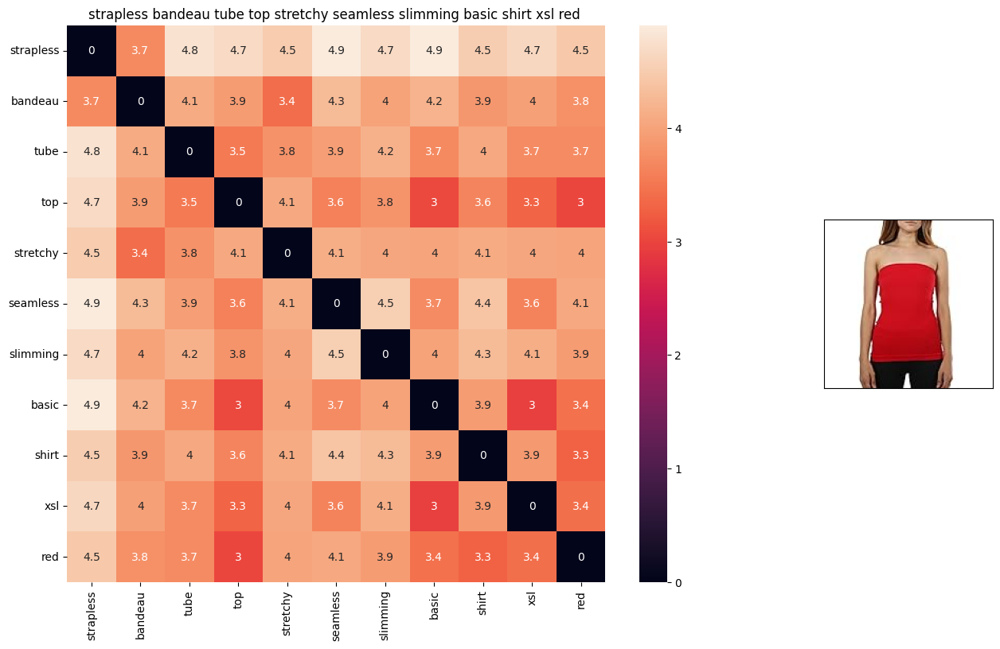

ASIN : B011FGS0N6
BRAND : Ekimo
euclidean distance from given input image : 0.0


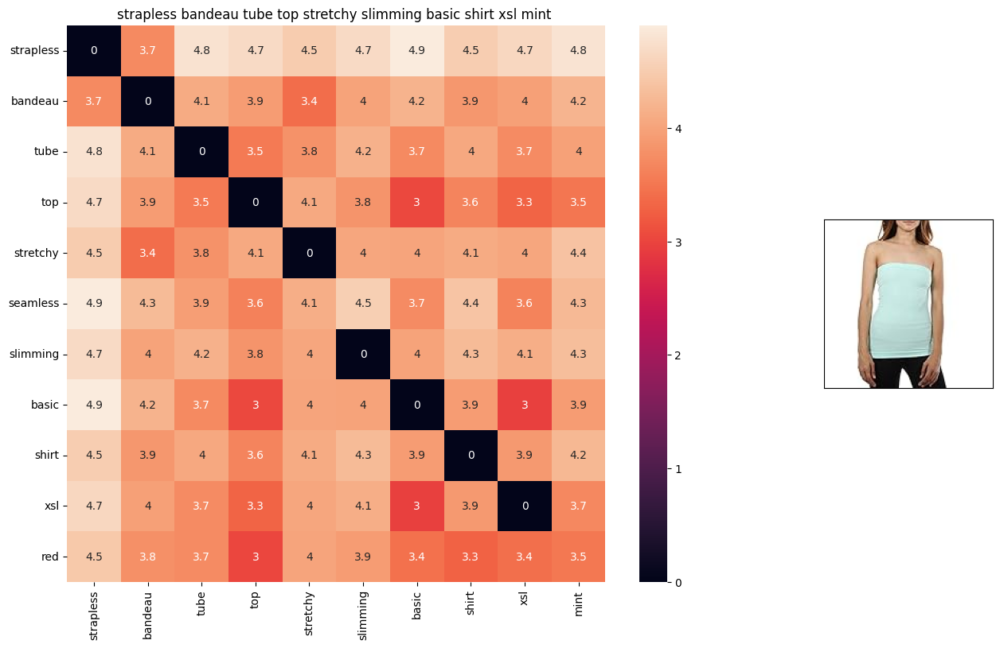

ASIN : B011FGS0RM
BRAND : Ekimo
euclidean distance from given input image : 0.4285661


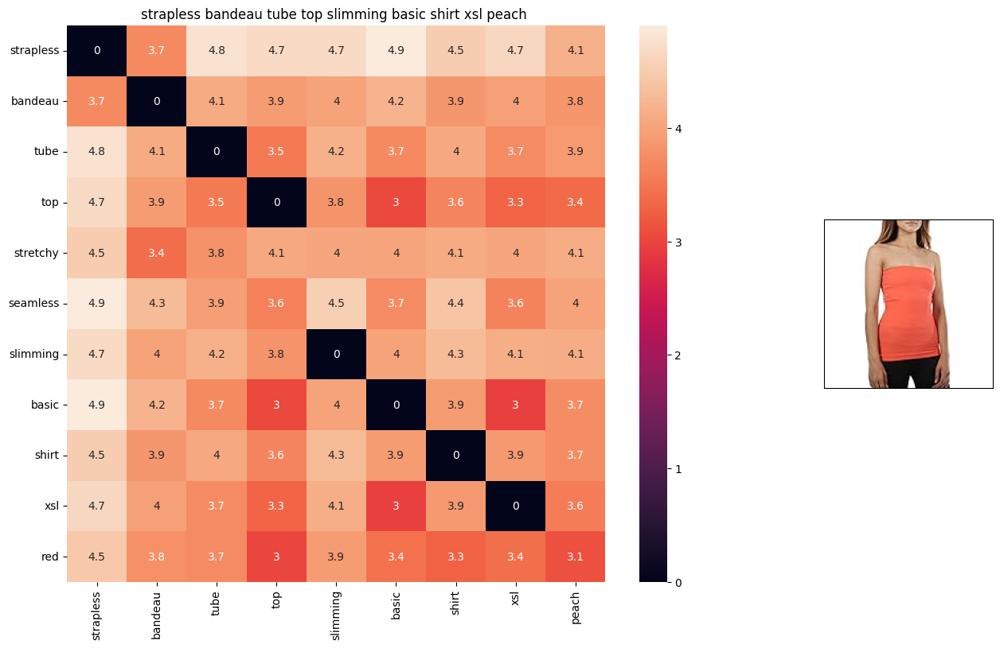

ASIN : B011FGS0RC
BRAND : Ekimo
euclidean distance from given input image : 0.50781226


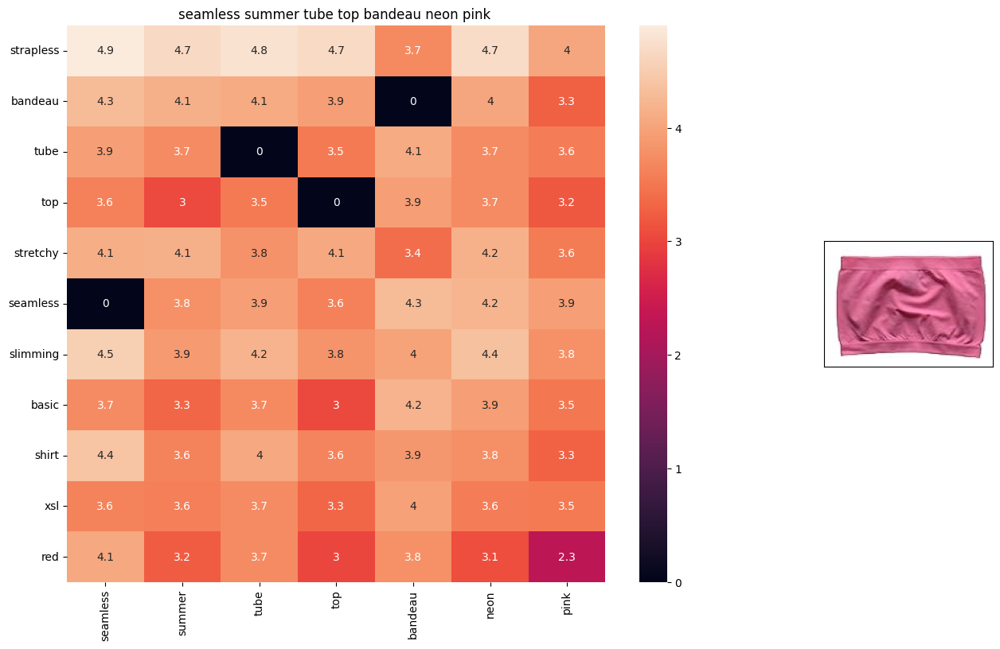

ASIN : B000OF2PFE
BRAND : Fornia
euclidean distance from given input image : 0.9172296


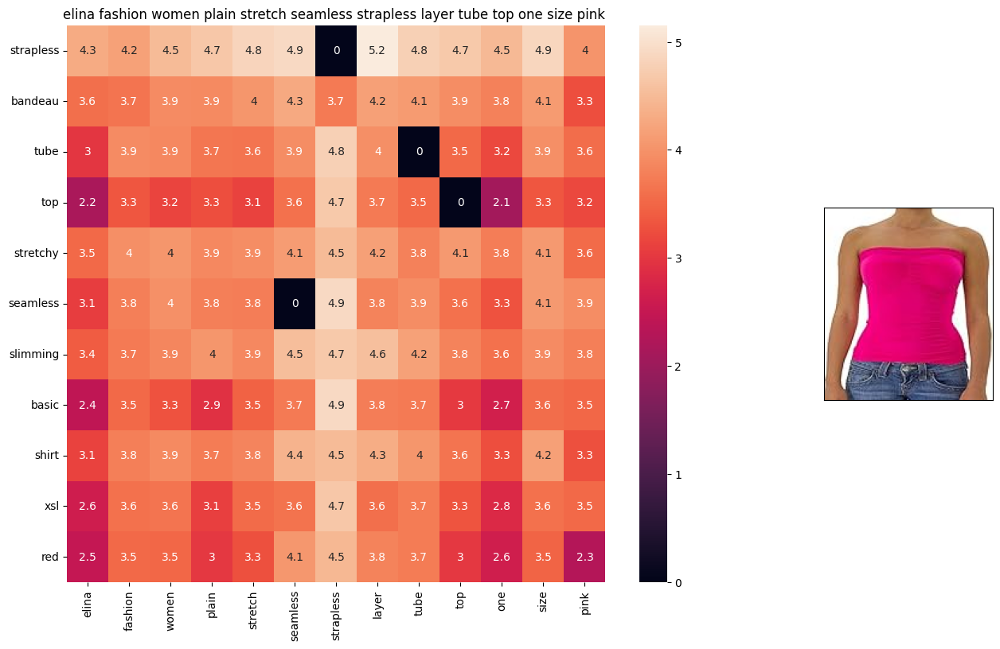

ASIN : B01GQ8OL4K
BRAND : ELINA FASHION
euclidean distance from given input image : 0.9184891


In [169]:
recommendation = Recommendation_avg_word2vec('B011FGS0N6', 5)
recommendation.avg_w2v_model()

## Average Word to Vec using Title, Color, Brand, and Product types.

In [164]:
# -- coding: UTF-8 --
"""
Method to recommend similar product based on color, brand, product type, and title.
========================================================================================
"""
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import requests
import plotly
import pickle
import logging
import plotly.figure_factory as ff
from matplotlib import gridspec
from scipy.sparse import hstack
from io import BytesIO
import numpy as np
from PIL import Image
from sklearn.metrics import pairwise_distances
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

__author__ = "msalamiitd@gmail.com"
LOGGER = logging.getLogger(__name__)


class Recommend_with_features_avg_w2v:
    """

    """
    def __init__(self, asin, num_results, w1, w2):
        self.extra_features = None
        self.model = None
        self.title_features = None
        self.title_vectorizer = None
        self.w1 = w1
        self.w2 = w2
        self.colors = None
        self.types = None
        self.brands = None
        self.data = pd.read_pickle('/home/shobot/Desktop/Project pro/Amazon Product Reviews/pickels/16k_apperal_data_preprocessed')
        self.asin = asin
        self.num_results = num_results
        self.w2v_title = []

    def add_features(self):
        self.data['brand'].fillna(value="Not given", inplace=True)
        self.brands = [x.replace(" ", "-") for x in self.data['brand'].values]
        self.types = [x.replace(" ", "-") for x in self.data['product_type_name'].values]
        self.colors = [x.replace(" ", "-") for x in self.data['color'].values]

        brand_vectorizer = CountVectorizer()
        brand_features = brand_vectorizer.fit_transform(self.brands)

        type_vectorizer = CountVectorizer()
        type_features = type_vectorizer.fit_transform(self.types)

        color_vectorizer = CountVectorizer()
        color_features = color_vectorizer.fit_transform(self.colors)

        extra_features = hstack((brand_features, type_features, color_features)).tocsr()
        return extra_features

    def display_img(self, url: str) -> list:
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        plt.imshow(img)

    def get_distance(self, vec1: list, vec2: list) -> list:
        final_dist = []
        for i in vec1:
            dist = []
            for j in vec2:
                dist.append(np.linalg.norm(i - j))
            final_dist.append(np.array(dist))
        return np.array(final_dist)

    def get_word_vec(self, sentence: str, doc_id: str) -> list:
        vec = []
        for i in sentence.split():
            if i in self.vocab:
                vec.append(self.model[i])
            else:
                vec.append(np.zeros(shape=(300,)))
        return np.array(vec)

    def vectorized(self):
        title_vectorizer = TfidfVectorizer(min_df=0.0)
        title_features = title_vectorizer.fit_transform(self.data['title'])
        return title_vectorizer, title_features

    def build_avg_vec(self, sentence, num_features, doc_id, m_name):
        featureVec = np.zeros((num_features,), dtype="float32")
        nwords = 0
        for word in sentence.split():
            nwords += 1
            if word in self.vocab:
                featureVec = np.add(featureVec, self.model[word])
        if nwords > 0:
            featureVec = np.divide(featureVec, nwords)
        return featureVec

    def heat_map_w2v_brand(self, sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
        s1_vec = self.get_word_vec(sentance1, doc_id1)
        s2_vec = self.get_word_vec(sentance2, doc_id2)
        s1_s2_dist = self.get_distance(s1_vec, s2_vec)
        data_matrix = [['Asin', 'Brand', 'Color', 'Product type'],
                       [self.data['asin'].loc[df_id1], self.brands[doc_id1], self.colors[doc_id1], self.types[doc_id1]],
                       [self.data['asin'].loc[df_id2], self.brands[doc_id2], self.colors[doc_id2], self.types[doc_id2]]]
        colorscale = [[0, '#1d004d'], [.5, '#f2e5ff'], [1, '#f2e5d1']]
        table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
        plotly.offline.iplot(table, filename='simple_table')
        gs = gridspec.GridSpec(25, 15)
        fig = plt.figure(figsize=(25, 5))
        ax1 = plt.subplot(gs[:, :-5])
        ax1 = sns.heatmap(np.round(s1_s2_dist, 6), annot=True)
        ax1.set_xticklabels(sentance2.split(), rotation='vertical')
        ax1.set_yticklabels(sentance1.split(), rotation='horizontal')
        ax1.set_title(sentance2)
        ax2 = plt.subplot(gs[:, 10:16])
        ax2.grid(False)
        ax2.set_xticks([])
        ax2.set_yticks([])
        self.display_img(url)
        plt.show()

    def avg_w2v_brand(self):
        self.data = self.data.reset_index(drop=True)
        self.asin_index = self.data[self.data['asin'] == self.asin].index
        if self.asin in self.data['asin'].values:
            doc_id = 0
            self.title_vectorizer, self.title_features = self.vectorized()  # Fix here
            with open('/home/shobot/Desktop/Project pro/Amazon Product Reviews/word2vec_model', 'rb') as f:
                self.model = pickle.load(f)
            self.vocab = self.model.keys()
            self.extra_features = self.add_features()
            for i in self.data['title']:
                self.w2v_title.append(self.build_avg_vec(i, 300, doc_id, 'avg'))
                doc_id += 1
            self.w2v_title = np.array(self.w2v_title)
            idf_w2v_dist = pairwise_distances(self.w2v_title, self.w2v_title[self.asin_index].reshape(1, -1))
            ex_feat_dist = pairwise_distances(self.extra_features, self.extra_features[self.asin_index])
            pairwise_dist = (self.w1 * idf_w2v_dist + self.w2 * ex_feat_dist) / float(self.w1 + self.w2)
            indices = np.argsort(pairwise_dist.flatten())[0:self.num_results]
            pdists = np.sort(pairwise_dist.flatten())[0:self.num_results]
            df_indices = list(self.data.index[indices])

            for i in range(0, len(indices)):
                self.heat_map_w2v_brand(self.data['title'].loc[df_indices[0]], self.data['title'].loc[df_indices[i]],
                                        self.data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],
                                        df_indices[0],
                                        df_indices[i], 'weighted')
                print('ASIN :', self.data['asin'].loc[df_indices[i]])
                print('Brand :', self.data['brand'].loc[df_indices[i]])
                print('euclidean distance from input :', pdists[i])
                print('=' * 100)
        else:
            print('ASIN number is not in data base')



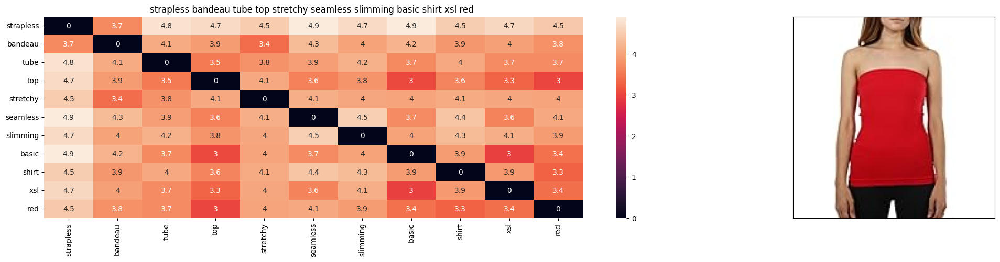

ASIN : B011FGS0N6
Brand : Ekimo
euclidean distance from input : 0.0


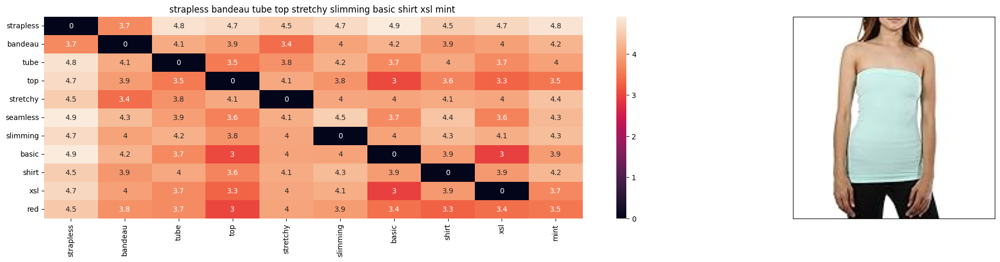

ASIN : B011FGS0RM
Brand : Ekimo
euclidean distance from input : 0.9213898183722165


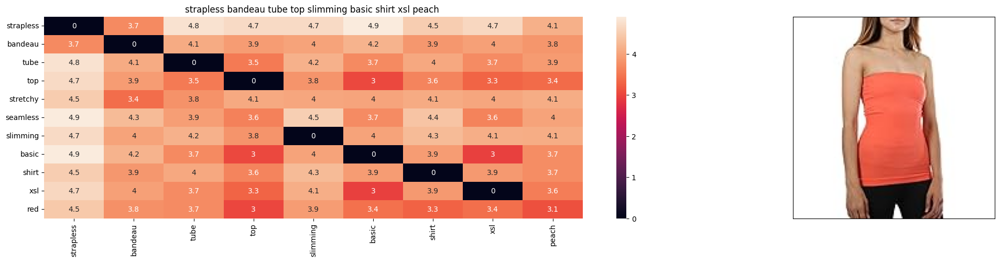

ASIN : B011FGS0RC
Brand : Ekimo
euclidean distance from input : 0.961012911977258


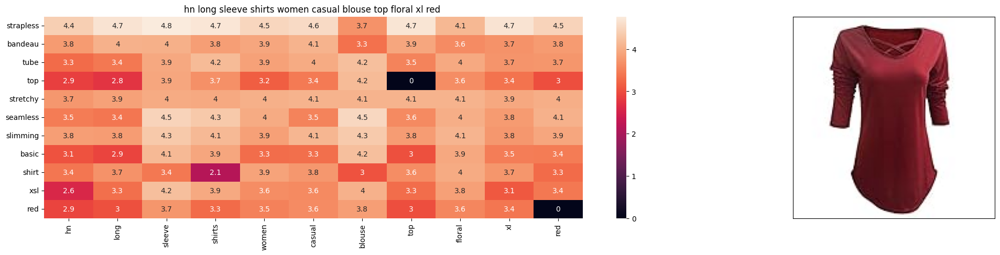

ASIN : B0711KH9DX
Brand : H&N
euclidean distance from input : 1.017506217956543


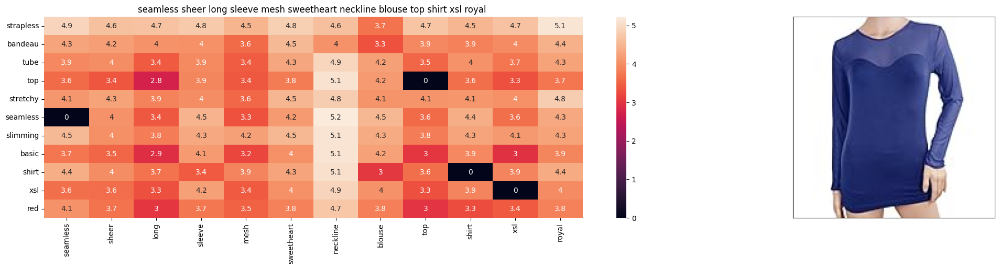

ASIN : B01LZ6F76N
Brand : Ekimo
euclidean distance from input : 1.177948618115869


In [165]:
recommendation = Recommend_with_features_avg_w2v('B011FGS0N6', 5, 5, 5)
recommendation.avg_w2v_brand()

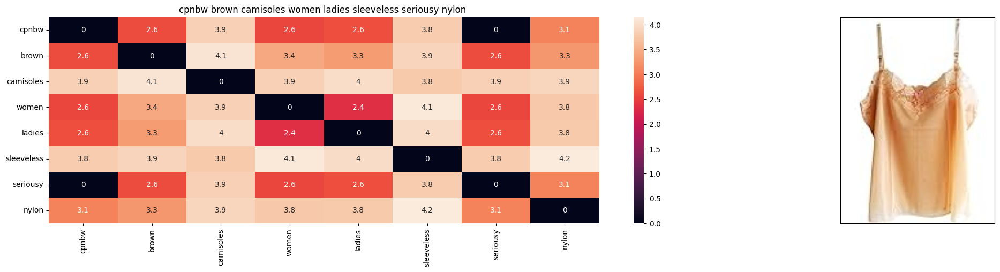

ASIN : B00NURPXK2
Brand : Nylon Camisoles-Blouse
euclidean distance from input : 0.0


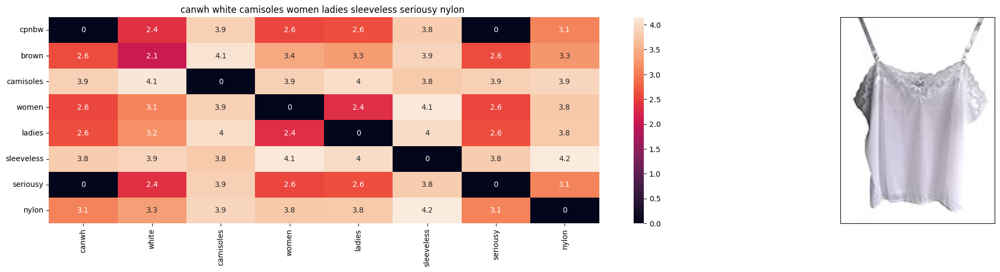

ASIN : B00NURFSYI
Brand : Nylon Camisoles-Blouse
euclidean distance from input : 0.8362336398977902


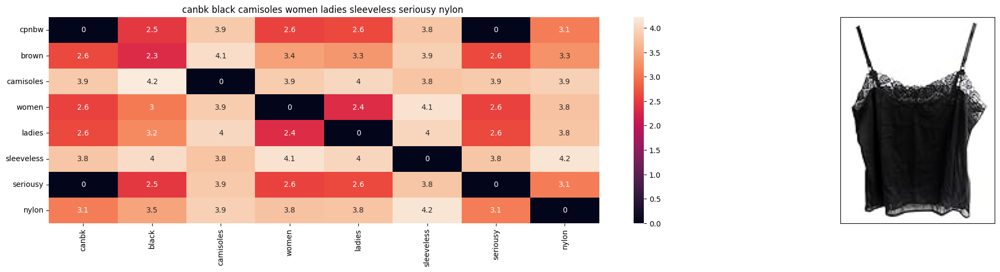

ASIN : B00NURIKMU
Brand : Nylon Camisoles-Blouse
euclidean distance from input : 0.8532076599020627


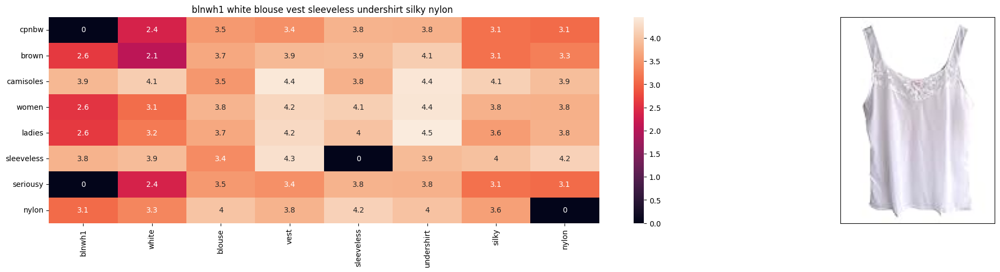

ASIN : B00NUSATPA
Brand : Nylon Camisoles-Blouse
euclidean distance from input : 1.2769283773321773


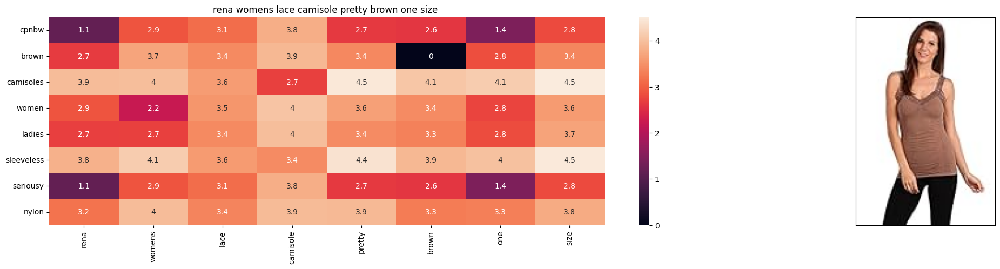

ASIN : B01CKFJ1ES
Brand : M. Rena
euclidean distance from input : 1.4616376399993896


In [166]:
recommendation = Recommend_with_features_avg_w2v('B00NURPXK2', 5, 5, 5)
recommendation.avg_w2v_brand()

# Weighted average word 2 Vec using Titles.

In [124]:
# -- coding: UTF-8 --
"""
Convert text into audio.
====================================
"""
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle
import requests
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
import seaborn as sns
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
import numpy as np


class Recommendation_weighted_avg_word2vec:
    def __init__(self, asin, num_results):
        self.vocab = None
        self.model = None
        self.title_features = None
        self.title_vectorizer = None
        self.w2v_title = []
        self.data = pd.read_pickle(
            '/home/shobot/Desktop/Project pro/Amazon Product Reviews/pickels/16k_apperal_data_preprocessed')
        self.asin = asin
        self.num_results = num_results

    def display_img(self, url, ax, fig):
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        plt.imshow(img)

    def get_distance(self, vec1, vec2):
        final_dist = []
        for i in vec1:
            dist = []
            for j in vec2:
                dist.append(np.linalg.norm(i - j))
            final_dist.append(np.array(dist))
        return np.array(final_dist)

    def get_word_vec(self, sentence, doc_id, m_name):
        vec = []
        for i in sentence.split():
            if i in self.vocab and i in self.title_vectorizer.vocabulary_:
                vec.append(self.title_features[doc_id, self.title_vectorizer.vocabulary_[i]] * self.model[i])
            else:
                vec.append(np.zeros(shape=(300,)))
        return np.array(vec)

    def build_avg_vec(self, sentence, num_features, doc_id, m_name):

        featureVec = np.zeros((num_features,), dtype="float32")
        nwords = 0
        for word in sentence.split():
            nwords += 1
            if word in self.vocab:
                featureVec = np.add(featureVec, self.model[word])
        if nwords > 0:
            featureVec = np.divide(featureVec, nwords)
        return featureVec

    def heat_map_w2v(self, sentence1, sentence2, url, doc_id1, doc_id2, model):
        s1_vec = self.get_word_vec(sentence1, doc_id1, model)
        s2_vec = self.get_word_vec(sentence2, doc_id2, model)
        s1_s2_dist = self.get_distance(s1_vec, s2_vec)
        gs = gridspec.GridSpec(2, 2, width_ratios=[4, 1], height_ratios=[2, 1])
        fig = plt.figure(figsize=(15, 15))
        ax = plt.subplot(gs[0])
        ax = sns.heatmap(np.round(s1_s2_dist, 4), annot=True)
        ax.set_xticklabels(sentence2.split(), rotation='vertical')
        ax.set_yticklabels(sentence1.split(), rotation='horizontal')
        ax.set_title(sentence2)

        ax = plt.subplot(gs[1])
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        self.display_img(url, ax, fig)

        plt.show()
    def vectorized(self):
        title_vectorizer = TfidfVectorizer(min_df=0.0)
        title_features = title_vectorizer.fit_transform(self.data['title'])
        return title_vectorizer, title_features

    def weighted_w2v_model(self):
        self.data = self.data.reset_index(drop=True)
        self.asin_index = self.data[self.data['asin'] == self.asin].index
        if self.asin in self.data['asin'].values:
            doc_id = 0
            self.title_vectorizer, self.title_features = self.vectorized()  # Fix here
            with open('/home/shobot/Desktop/Project pro/Amazon Product Reviews/word2vec_model', 'rb') as f:
                self.model = pickle.load(f)
            self.vocab = self.model.keys()
            for i in self.data['title']:
                self.w2v_title.append(self.build_avg_vec(i, 300, doc_id, 'avg'))
                doc_id += 1
            self.w2v_title = np.array(self.w2v_title)
            pairwise_dist = pairwise_distances(self.w2v_title, self.w2v_title[self.asin_index].reshape(1, -1))
            indices = np.argsort(pairwise_dist.flatten())[0:self.num_results]
            pdists = np.sort(pairwise_dist.flatten())[0:self.num_results]
            df_indices = list(self.data.index[indices])

            for i in range(0, len(indices)):
                self.heat_map_w2v(self.data['title'].loc[df_indices[0]], self.data['title'].loc[df_indices[i]],
                                  self.data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
                print('ASIN :', self.data['asin'].loc[df_indices[i]])
                print('BRAND :', self.data['brand'].loc[df_indices[i]])
                print('euclidean distance from given input image :', pdists[i])
                print('=' * 100)
        else:
            print('ASIN number is not in data base')




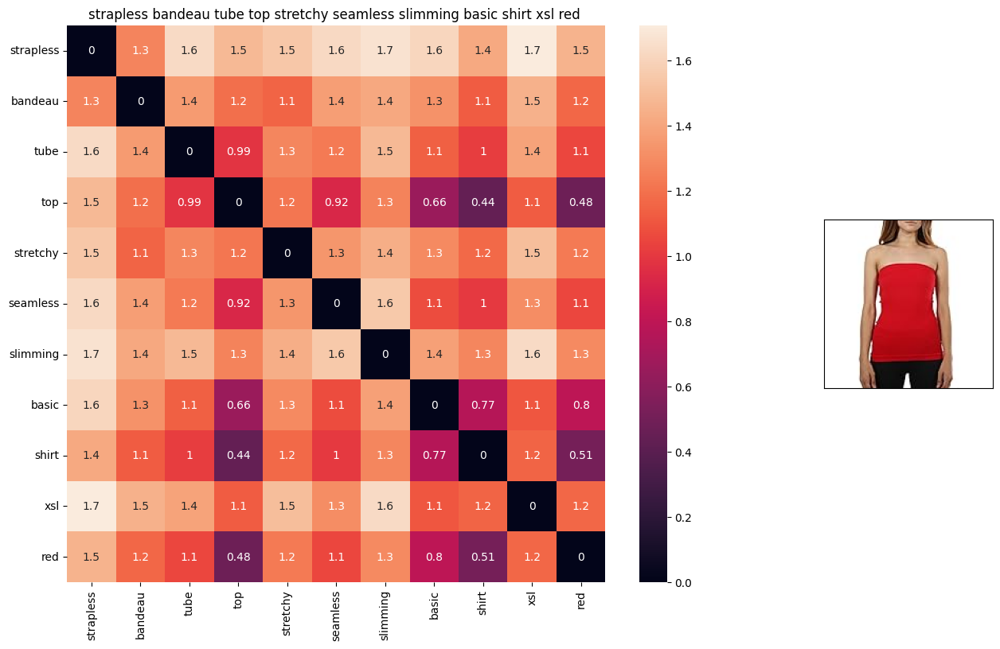

ASIN : B011FGS0N6
BRAND : Ekimo
euclidean distance from given input image : 0.0


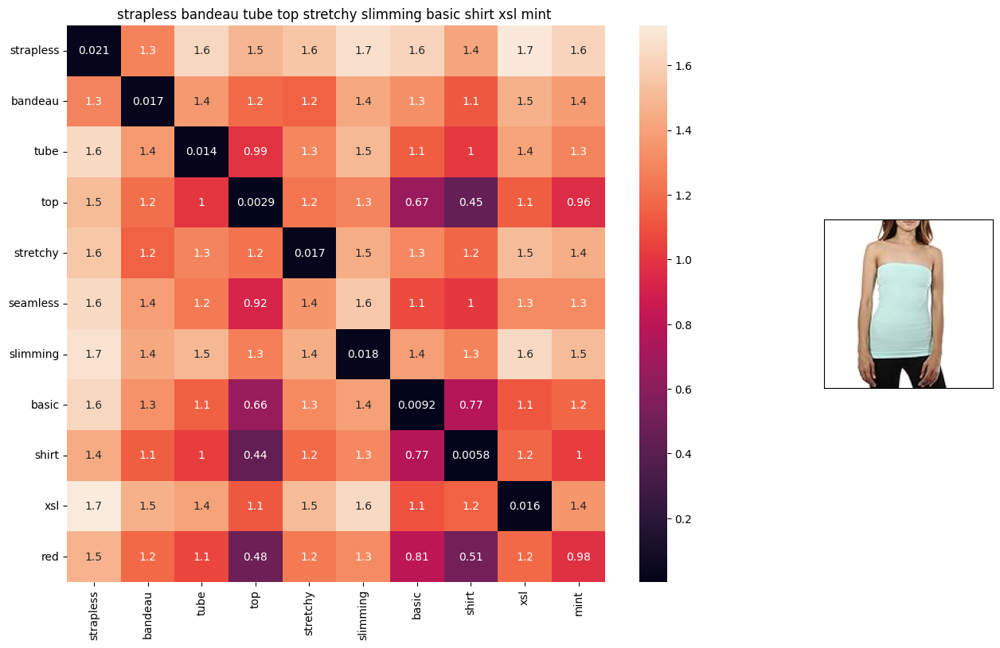

ASIN : B011FGS0RM
BRAND : Ekimo
euclidean distance from given input image : 0.4285661


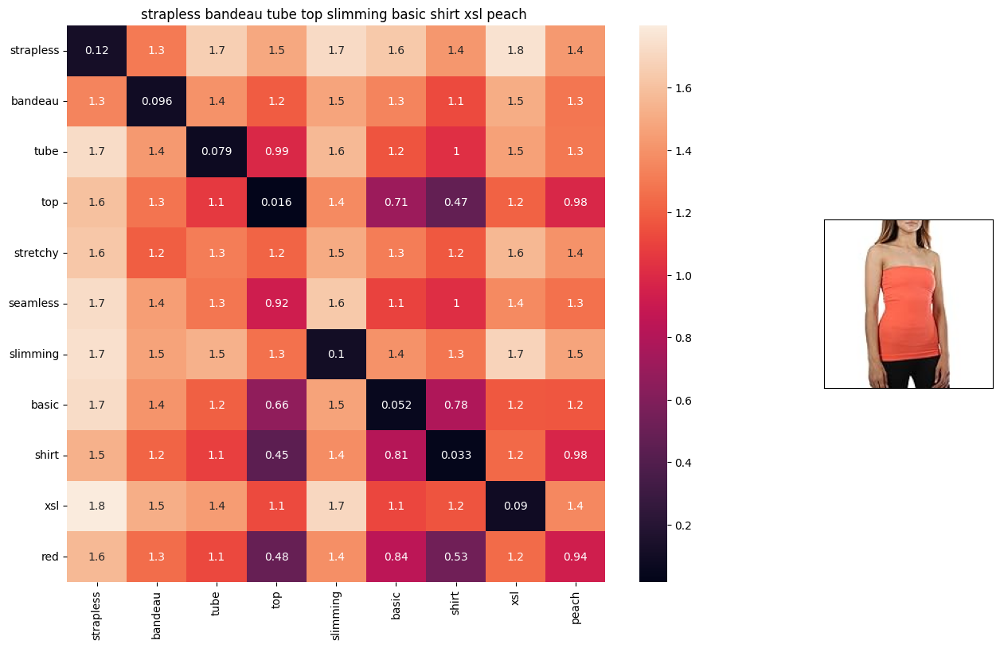

ASIN : B011FGS0RC
BRAND : Ekimo
euclidean distance from given input image : 0.50781226


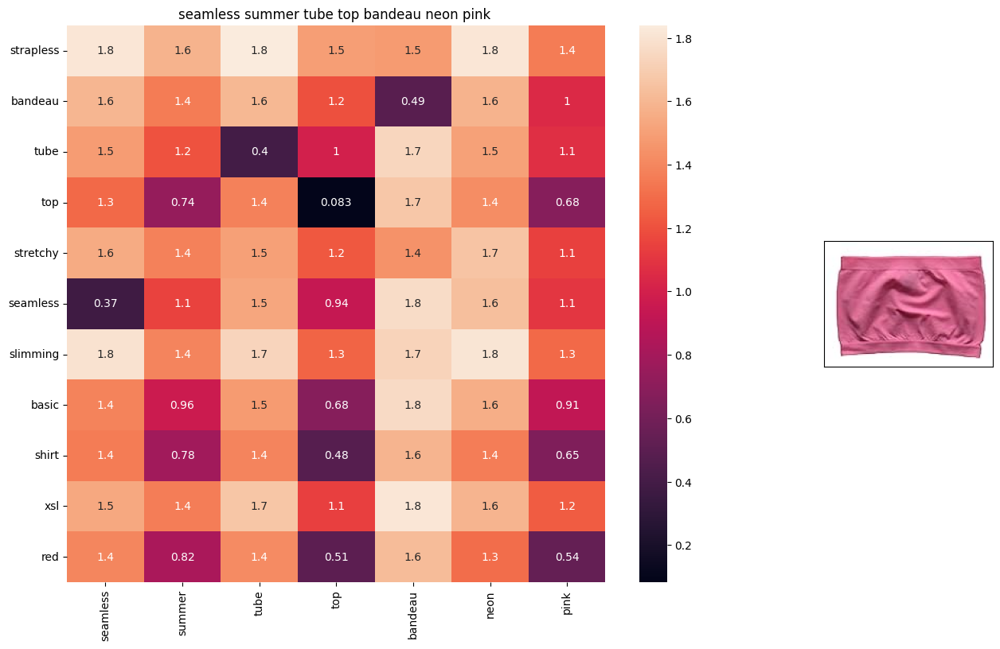

ASIN : B000OF2PFE
BRAND : Fornia
euclidean distance from given input image : 0.9172296


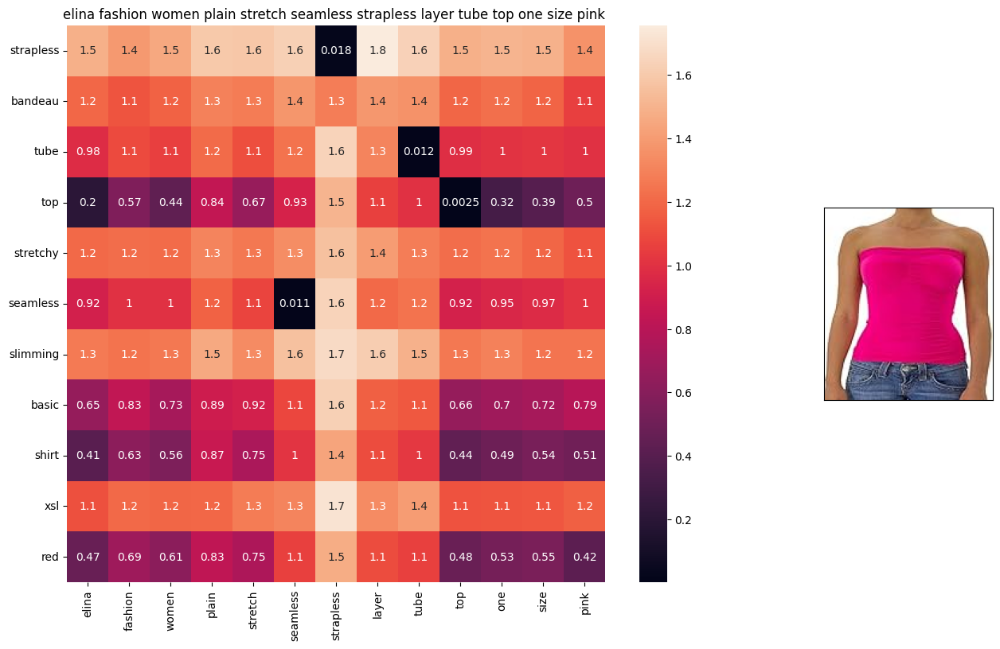

ASIN : B01GQ8OL4K
BRAND : ELINA FASHION
euclidean distance from given input image : 0.9184891


In [155]:
recommendation = Recommendation_weighted_avg_word2vec('B011FGS0N6', 5)
recommendation.weighted_w2v_model()

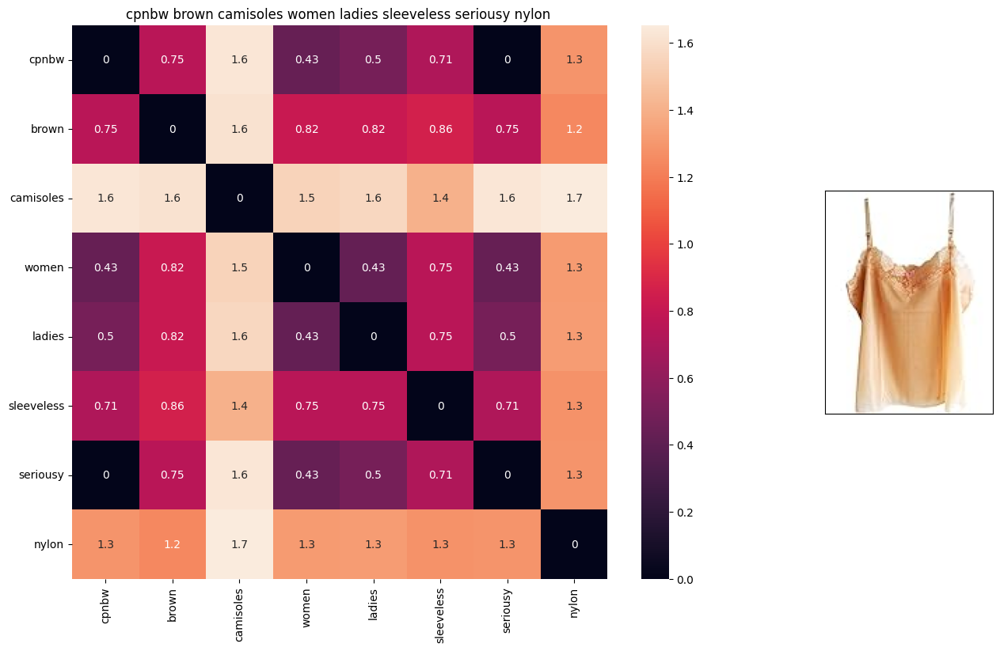

ASIN : B00NURPXK2
BRAND : Nylon Camisoles-Blouse
euclidean distance from given input image : 0.0


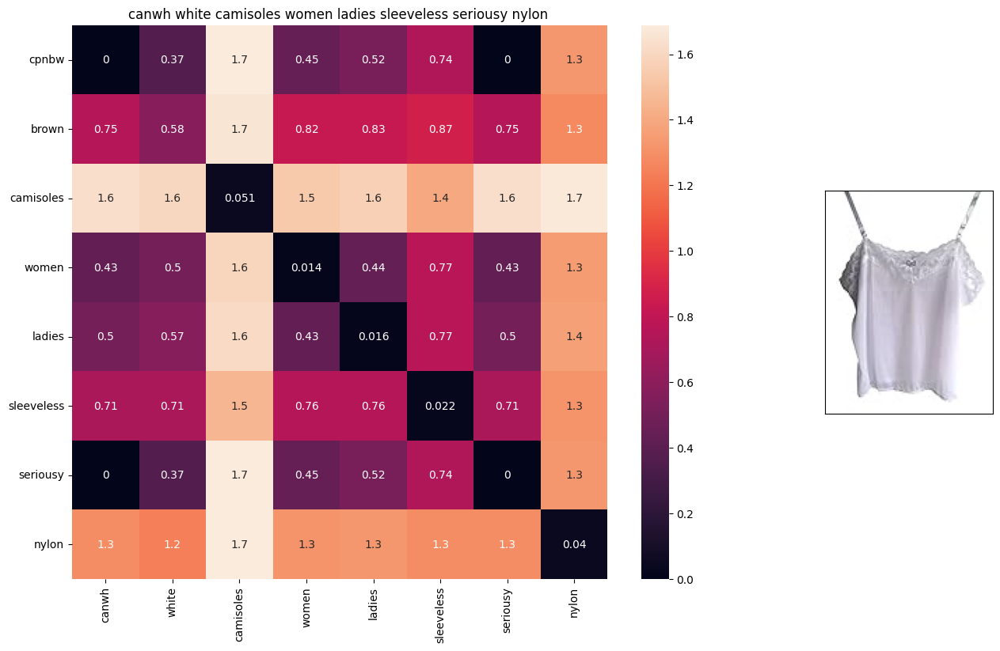

ASIN : B00NURFSYI
BRAND : Nylon Camisoles-Blouse
euclidean distance from given input image : 0.25825372


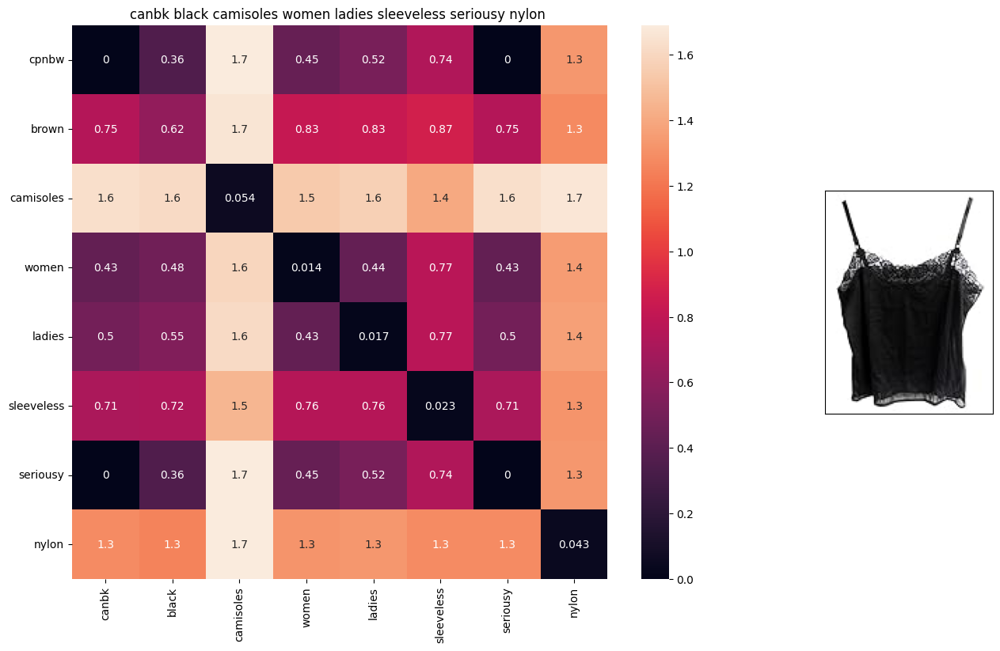

ASIN : B00NURIKMU
BRAND : Nylon Camisoles-Blouse
euclidean distance from given input image : 0.29220176


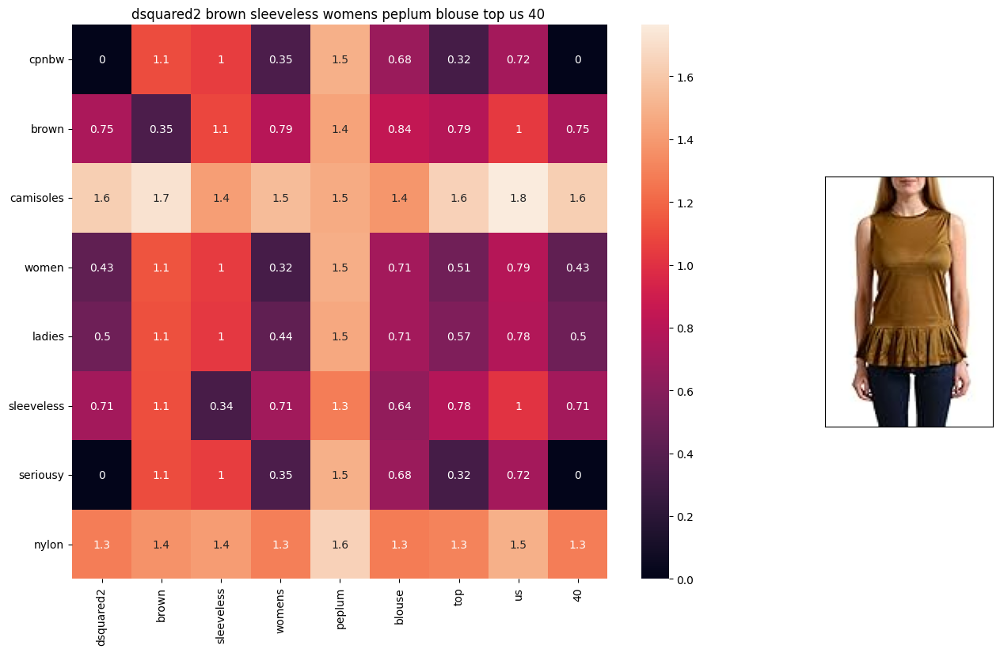

ASIN : B01EG15FVC
BRAND : DSQUARED2
euclidean distance from given input image : 0.77998585


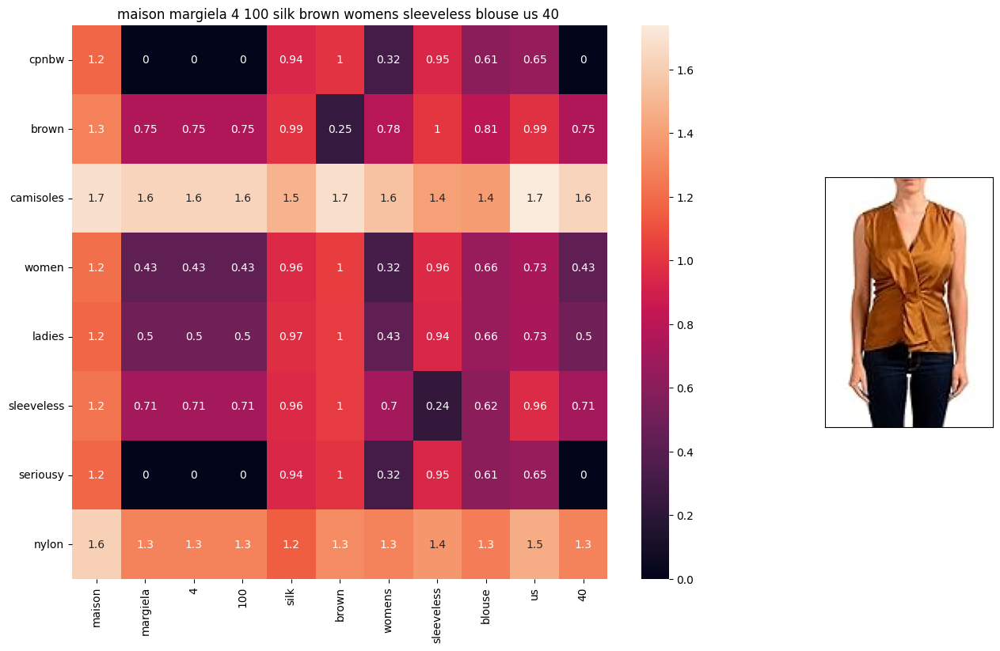

ASIN : B074FW26VT
BRAND : Maison Margiela
euclidean distance from given input image : 0.7943699


In [156]:
recommendation = Recommendation_weighted_word2vec('B00NURPXK2', 5)
recommendation.weighted_w2v_model()


# Weighted average word 2 Vec using Titles, Brand, Color, and Product_type.

In [158]:
# -- coding: UTF-8 --
"""
Method to recommend similar product based on color, brand, product type, and title.
========================================================================================
"""
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import requests
import plotly
import pickle
import logging
import plotly.figure_factory as ff
from matplotlib import gridspec
from scipy.sparse import hstack
from io import BytesIO
import numpy as np
from PIL import Image
from sklearn.metrics import pairwise_distances
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

__author__ = "msalamiitd@gmail.com"
LOGGER = logging.getLogger(__name__)


class Recommend_with_features:
    """

    """
    def __init__(self, asin, num_results, w1, w2):
        self.extra_features = None
        self.model = None
        self.title_features = None
        self.title_vectorizer = None
        self.w1 = w1
        self.w2 = w2
        self.colors = None
        self.types = None
        self.brands = None
        self.data = pd.read_pickle('/home/shobot/Desktop/Project pro/Amazon Product Reviews/pickels/16k_apperal_data_preprocessed')
        self.asin = asin
        self.num_results = num_results
        self.w2v_title = []

    def add_features(self):
        self.data['brand'].fillna(value="Not given", inplace=True)
        self.brands = [x.replace(" ", "-") for x in self.data['brand'].values]
        self.types = [x.replace(" ", "-") for x in self.data['product_type_name'].values]
        self.colors = [x.replace(" ", "-") for x in self.data['color'].values]

        brand_vectorizer = CountVectorizer()
        brand_features = brand_vectorizer.fit_transform(self.brands)

        type_vectorizer = CountVectorizer()
        type_features = type_vectorizer.fit_transform(self.types)

        color_vectorizer = CountVectorizer()
        color_features = color_vectorizer.fit_transform(self.colors)

        extra_features = hstack((brand_features, type_features, color_features)).tocsr()
        return extra_features

    def display_img(self, url: str) -> list:
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        plt.imshow(img)

    def get_distance(self, vec1: list, vec2: list) -> list:
        final_dist = []
        for i in vec1:
            dist = []
            for j in vec2:
                dist.append(np.linalg.norm(i - j))
            final_dist.append(np.array(dist))
        return np.array(final_dist)

    def get_word_vec(self, sentence: str, doc_id: str) -> list:
        vec = []
        for i in sentence.split():
            if i in self.vocab and i in self.title_vectorizer.vocabulary_:
                vec.append(self.title_features[doc_id, self.title_vectorizer.vocabulary_[i]] * self.model[i])
            else:
                vec.append(np.zeros(shape=(300,)))
        return np.array(vec)

    def vectorized(self):
        title_vectorizer = TfidfVectorizer(min_df=0.0)
        title_features = title_vectorizer.fit_transform(self.data['title'])
        return title_vectorizer, title_features

    def build_avg_vec(self, sentence, num_features, doc_id, m_name):
        featureVec = np.zeros((num_features,), dtype="float32")
        nwords = 0
        for word in sentence.split():
            nwords += 1
            if word in self.vocab:
                featureVec = np.add(featureVec, self.model[word])
        if nwords > 0:
            featureVec = np.divide(featureVec, nwords)
        return featureVec

    def heat_map_w2v_brand(self, sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
        s1_vec = self.get_word_vec(sentance1, doc_id1)
        s2_vec = self.get_word_vec(sentance2, doc_id2)
        s1_s2_dist = self.get_distance(s1_vec, s2_vec)
        data_matrix = [['Asin', 'Brand', 'Color', 'Product type'],
                       [self.data['asin'].loc[df_id1], self.brands[doc_id1], self.colors[doc_id1], self.types[doc_id1]],
                       [self.data['asin'].loc[df_id2], self.brands[doc_id2], self.colors[doc_id2], self.types[doc_id2]]]
        colorscale = [[0, '#1d004d'], [.5, '#f2e5ff'], [1, '#f2e5d1']]
        table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
        plotly.offline.iplot(table, filename='simple_table')
        gs = gridspec.GridSpec(25, 15)
        fig = plt.figure(figsize=(25, 5))
        ax1 = plt.subplot(gs[:, :-5])
        ax1 = sns.heatmap(np.round(s1_s2_dist, 6), annot=True)
        ax1.set_xticklabels(sentance2.split(), rotation='vertical')
        ax1.set_yticklabels(sentance1.split(), rotation='horizontal')
        ax1.set_title(sentance2)
        ax2 = plt.subplot(gs[:, 10:16])
        ax2.grid(False)
        ax2.set_xticks([])
        ax2.set_yticks([])
        self.display_img(url)
        plt.show()

    def idf_w2v_brand(self):
        self.data = self.data.reset_index(drop=True)
        self.asin_index = self.data[self.data['asin'] == self.asin].index
        if self.asin in self.data['asin'].values:
            doc_id = 0
            self.title_vectorizer, self.title_features = self.vectorized()  # Fix here
            with open('/home/shobot/Desktop/Project pro/Amazon Product Reviews/word2vec_model', 'rb') as f:
                self.model = pickle.load(f)
            self.vocab = self.model.keys()
            self.extra_features = self.add_features()
            for i in self.data['title']:
                self.w2v_title.append(self.build_avg_vec(i, 300, doc_id, 'avg'))
                doc_id += 1
            self.w2v_title = np.array(self.w2v_title)
            idf_w2v_dist = pairwise_distances(self.w2v_title, self.w2v_title[self.asin_index].reshape(1, -1))
            ex_feat_dist = pairwise_distances(self.extra_features, self.extra_features[self.asin_index])
            pairwise_dist = (self.w1 * idf_w2v_dist + self.w2 * ex_feat_dist) / float(self.w1 + self.w2)
            indices = np.argsort(pairwise_dist.flatten())[0:self.num_results]
            pdists = np.sort(pairwise_dist.flatten())[0:self.num_results]
            df_indices = list(self.data.index[indices])

            for i in range(0, len(indices)):
                self.heat_map_w2v_brand(self.data['title'].loc[df_indices[0]], self.data['title'].loc[df_indices[i]],
                                        self.data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],
                                        df_indices[0],
                                        df_indices[i], 'weighted')
                print('ASIN :', self.data['asin'].loc[df_indices[i]])
                print('Brand :', self.data['brand'].loc[df_indices[i]])
                print('euclidean distance from input :', pdists[i])
                print('=' * 100)
        else:
            print('ASIN number is not in data base')

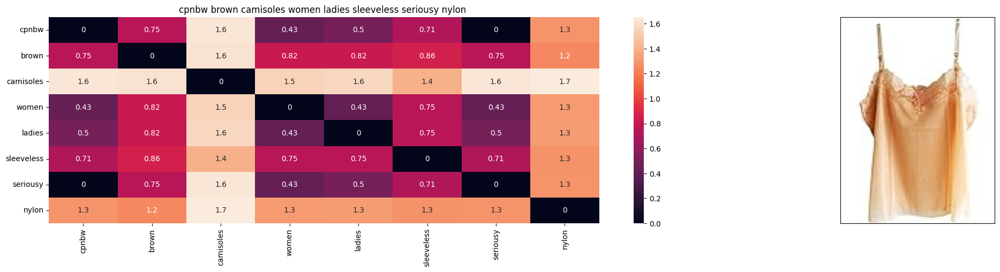

ASIN : B00NURPXK2
Brand : Nylon Camisoles-Blouse
euclidean distance from input : 0.0


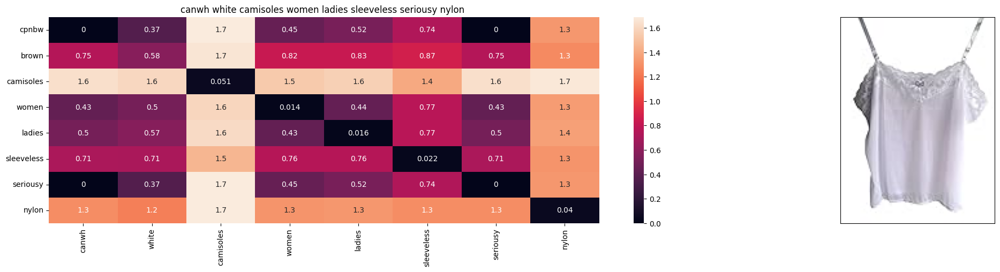

ASIN : B00NURFSYI
Brand : Nylon Camisoles-Blouse
euclidean distance from input : 0.8362336398977902


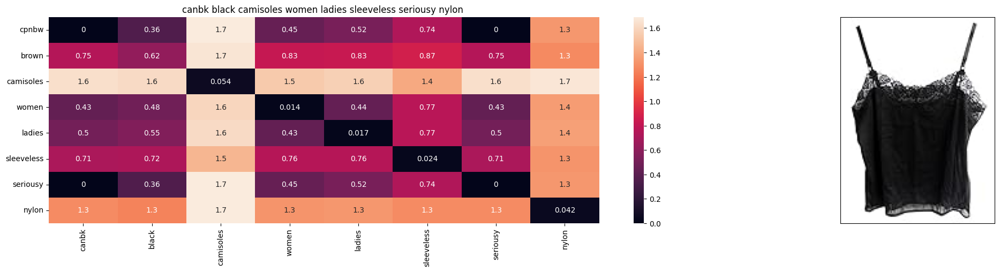

ASIN : B00NURIKMU
Brand : Nylon Camisoles-Blouse
euclidean distance from input : 0.8532076599020627


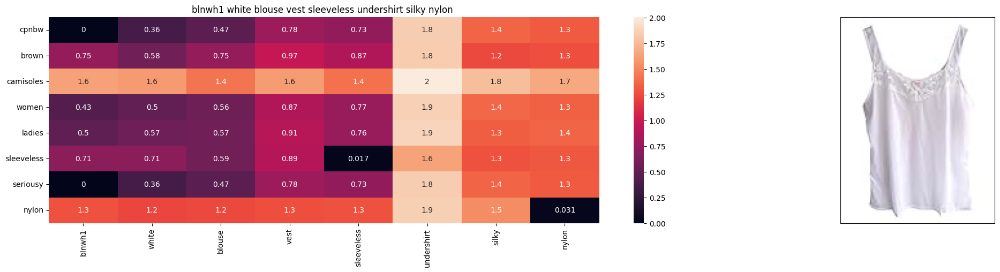

ASIN : B00NUSATPA
Brand : Nylon Camisoles-Blouse
euclidean distance from input : 1.2769283773321773


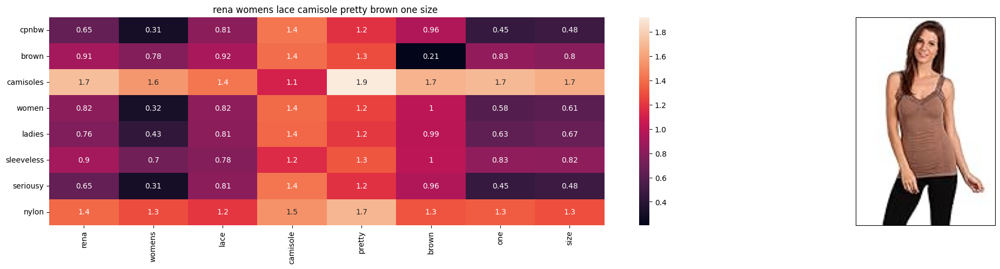

ASIN : B01CKFJ1ES
Brand : M. Rena
euclidean distance from input : 1.4616376399993896


In [159]:
recommendation = Recommend_with_features('B00NURPXK2', 5, 5, 5)
recommendation.idf_w2v_brand()

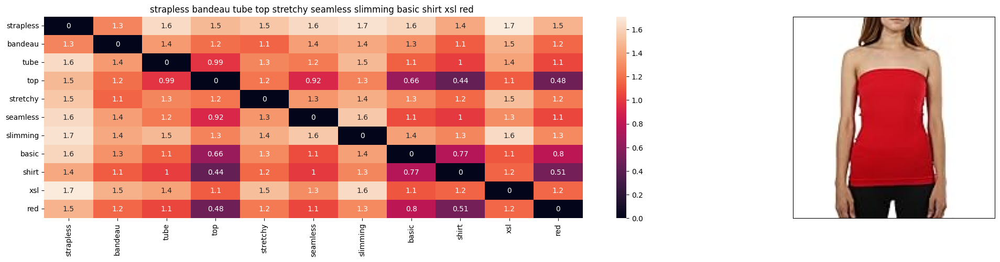

ASIN : B011FGS0N6
Brand : Ekimo
euclidean distance from input : 0.0


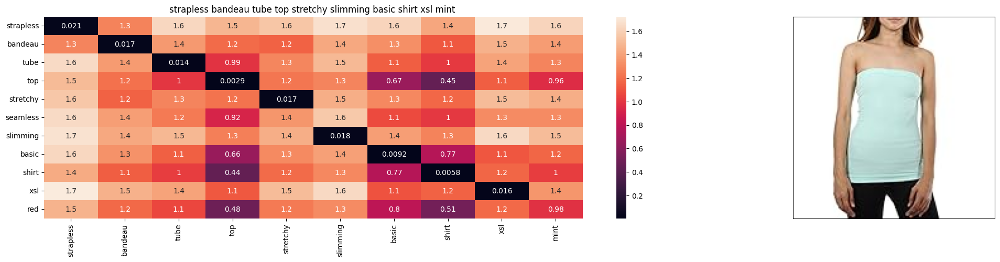

ASIN : B011FGS0RM
Brand : Ekimo
euclidean distance from input : 0.9213898183722165


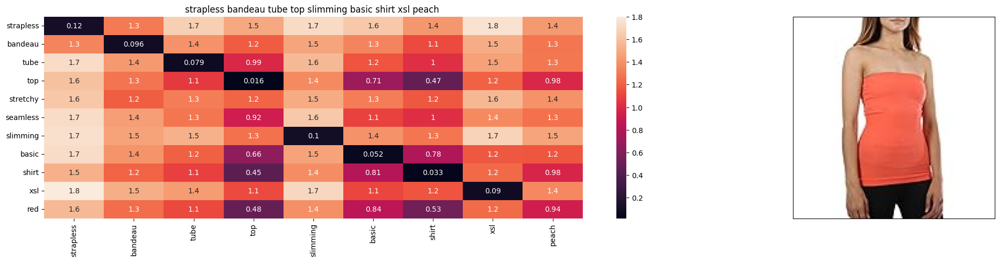

ASIN : B011FGS0RC
Brand : Ekimo
euclidean distance from input : 0.961012911977258


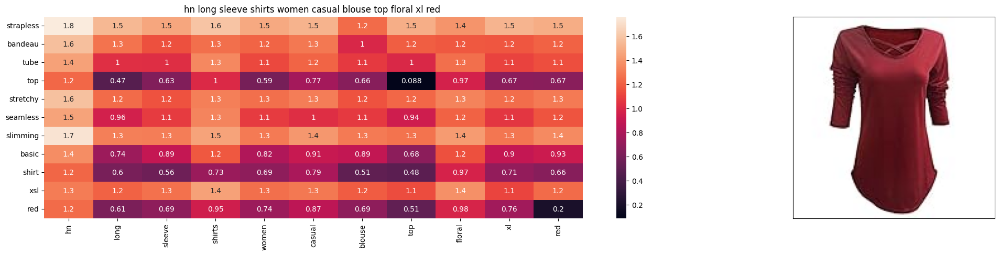

ASIN : B0711KH9DX
Brand : H&N
euclidean distance from input : 1.017506217956543


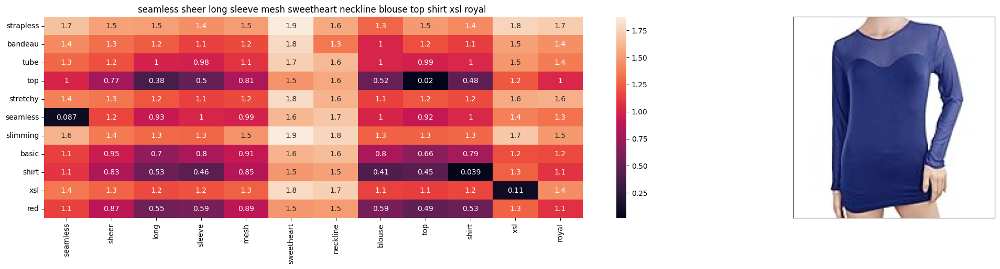

ASIN : B01LZ6F76N
Brand : Ekimo
euclidean distance from input : 1.177948618115869


In [160]:
recommendation = Recommend_with_features('B011FGS0N6', 5, 5, 5)
recommendation.idf_w2v_brand()

# Deep Learning Based Approach

## VGG16

In [ ]:
class Feature_extraction:
    def __init__(self):
        pass
    
    
    def 

In [139]:
import numpy as np
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
import requests
from io import BytesIO


class Deep_Learning_VGG16:
    def __init__(self):
        self.data = pd.read_pickle(
            '/home/shobot/Desktop/Project pro/Amazon Product Reviews/16k_apperal_data_preprocessed')
        self.df_asins = list(self.data['asin'])
        self.bottleneck_features_train = np.load(
            '/home/shobot/Desktop/Project pro/Amazon Product Reviews/16k_data_cnn_features.npy')
        self.asins = np.load('/home/shobot/Desktop/Project pro/Amazon Product Reviews/16k_data_cnn_feature_asins.npy')

    # get similar products using CNN features (VGG-16)
    def get_similar_products_cnn(self, doc_id, num_results):
        self.data = self.data.reset_index(drop=True)
        doc_id = self.data[self.data['asin'] == doc_id].index
        asins = list(self.asins)
        #doc_id = asins.index(self.df_asins[doc_id])
        pairwise_dist = pairwise_distances(self.bottleneck_features_train,
                                           self.bottleneck_features_train[doc_id].reshape(1, -1))

        indices = np.argsort(pairwise_dist.flatten())[0:num_results]
        pdists = np.sort(pairwise_dist.flatten())[0:num_results]
        for i in range(len(indices)):
            rows = self.data[['asin', 'brand', 'medium_image_url', 'title']].loc[self.data['asin'] == asins[indices[i]]]
            for indx, row in rows.iterrows():
                try:
                    img = Image.open(BytesIO(requests.get(row['medium_image_url']).content))
                    print('Product Title: ', row['title'])
                    print('ASIN :', row['asin'])
                    print('Brand:', row['brand'])
                    print('Euclidean Distance from input image:', pdists[i])
                    print('Amazon Url: www.amzon.com/dp/' + asins[indices[i]])
                    plt.imshow(img)
                    plt.show()
                except:
                    print('Product URL is not working')


Product Title:  sacred threads cotton silk lightweight ruffle front xs 
ASIN : B072F7B6RZ
Brand: Sacred Threads
Euclidean Distance from input image: 6.538062e-06
Amazon Url: www.amzon.com/dp/B072F7B6RZ


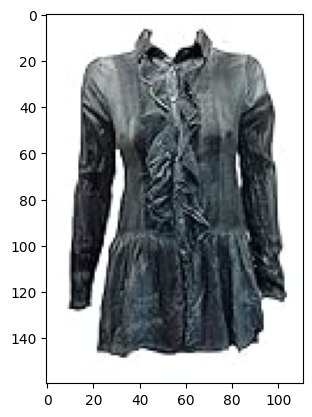

Product Title:  merona womens black checkered 34 button top small 
ASIN : B0722YSJBH
Brand: Merona
Euclidean Distance from input image: 39.508606
Amazon Url: www.amzon.com/dp/B0722YSJBH


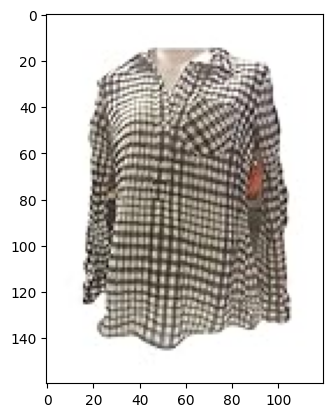

Product Title:  mossimo womens soft denim button shirt xxl light wash 
ASIN : B071NLLVN7
Brand: Mossimo
Euclidean Distance from input image: 39.516506
Amazon Url: www.amzon.com/dp/B071NLLVN7


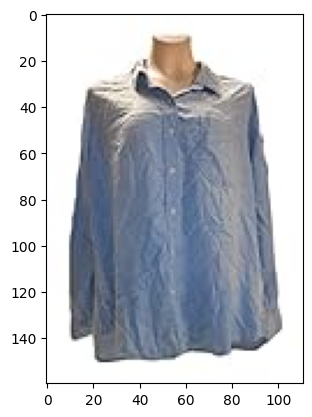

Product Title:  bop aborgin purple crinkle rayon barbara tunic 1x 
ASIN : B06XG7PXHP
Brand: WeBeBop We Be Bop
Euclidean Distance from input image: 39.66449
Amazon Url: www.amzon.com/dp/B06XG7PXHP


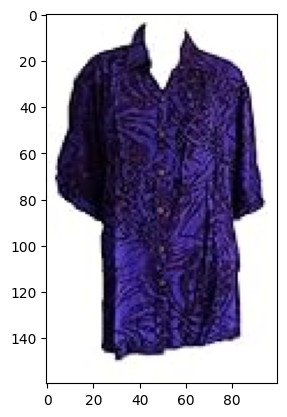

Product Title:  mossimo supply co womens dolman 34 sleeve pocket tee xxl olive 
ASIN : B071D4TRL7
Brand: Mossimo Supply Co
Euclidean Distance from input image: 39.97488
Amazon Url: www.amzon.com/dp/B071D4TRL7


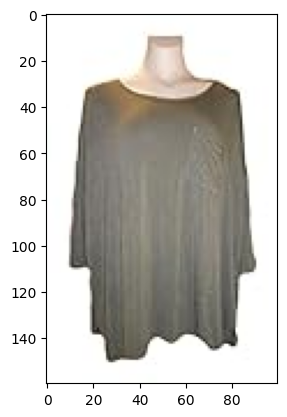

Product Title:  mossimo womens high neck long sleeve tunic medium blue 
ASIN : B0722P5DGV
Brand: Mossimo
Euclidean Distance from input image: 40.038757
Amazon Url: www.amzon.com/dp/B0722P5DGV


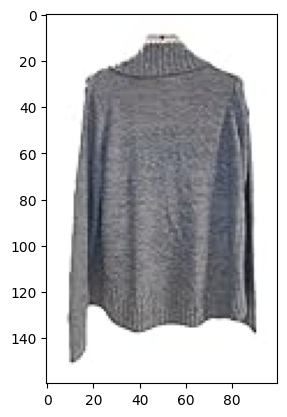

Product Title:  jm collection womens long sleeve blouse small  beige 
ASIN : B01B60K4IA
Brand: JM Collection
Euclidean Distance from input image: 40.162075
Amazon Url: www.amzon.com/dp/B01B60K4IA


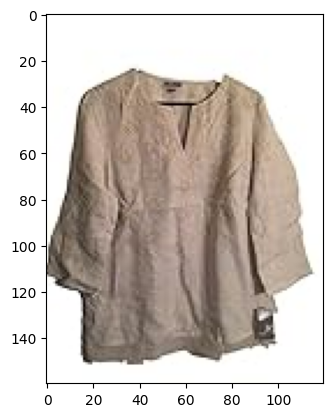

Product Title:  gant womens striped buttonup blouse 36 light blue 
ASIN : B0184RQNL0
Brand: GANT
Euclidean Distance from input image: 40.52835
Amazon Url: www.amzon.com/dp/B0184RQNL0


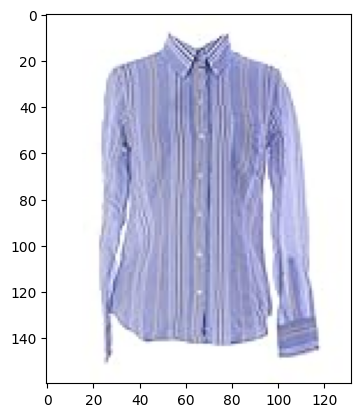

Product Title:  walter voulaz womens striped button tunic 44 multi 
ASIN : B01AS99RW4
Brand: Walter Voulaz
Euclidean Distance from input image: 40.835014
Amazon Url: www.amzon.com/dp/B01AS99RW4


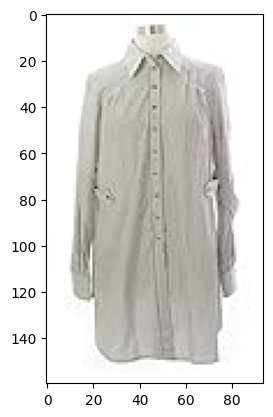

Product Title:  moda international victorias secret stretch lace turtleneck top largewinter white 
ASIN : B071ZKPQ9H
Brand: MODA INTERNATIONAL
Euclidean Distance from input image: 40.88316
Amazon Url: www.amzon.com/dp/B071ZKPQ9H


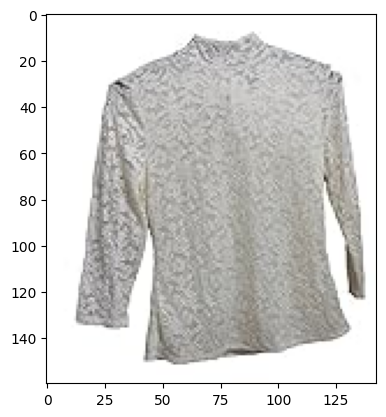

In [140]:
recommendation = Deep_Learning_VGG16()
recommendation.get_similar_products_cnn('B015YKMU80', 10)

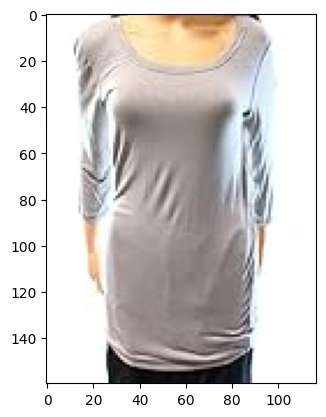

Product Title:  rosie pope womens large 34 sleeve scoop neck tee shirt gray l 
ASIN : B06XDKRM71
Brand: Rosie Pope
Euclidean Distance from input image: 6.32596e-06
Amazon Url: www.amzon.com/dp/B06XDKRM71


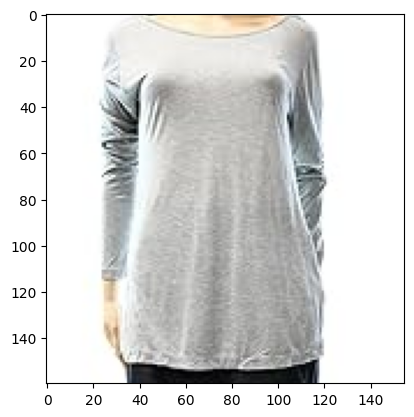

Product Title:  able womens medium draped back boat neck blouse gray 
ASIN : B0751G1GR9
Brand: able
Euclidean Distance from input image: 38.79052
Amazon Url: www.amzon.com/dp/B0751G1GR9


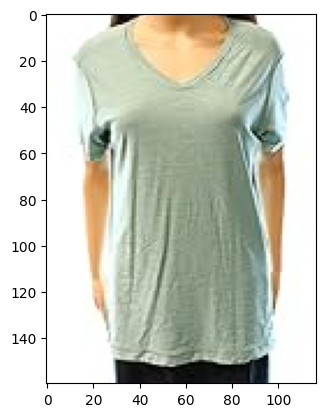

Product Title:  rogue state womens small vneck knit top green 
ASIN : B01MV37DJE
Brand: Rogue State
Euclidean Distance from input image: 41.400543
Amazon Url: www.amzon.com/dp/B01MV37DJE


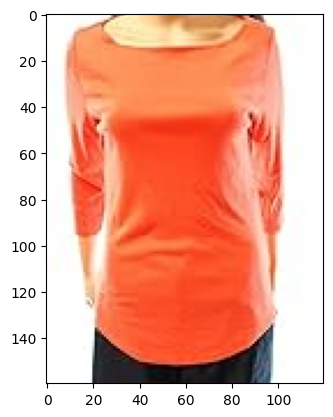

Product Title:  premise studio coral womens small solid seamed knit top orange 
ASIN : B074TTD44L
Brand: Premise Studio
Euclidean Distance from input image: 41.444664
Amazon Url: www.amzon.com/dp/B074TTD44L


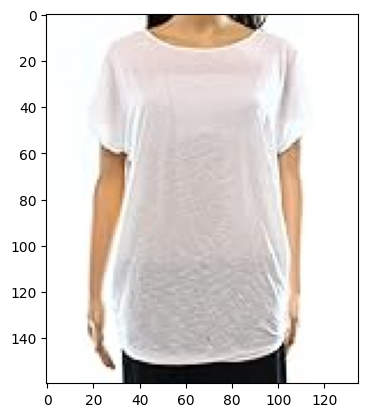

Product Title:  go couture womens small boatneck solid seamed blouse white 
ASIN : B07318GMQV
Brand: Go Couture
Euclidean Distance from input image: 42.28782
Amazon Url: www.amzon.com/dp/B07318GMQV


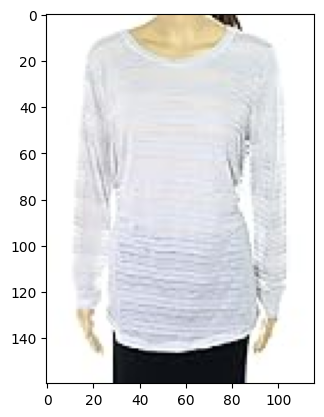

Product Title:  style  co womens medium long sleeve striped knit top gray 
ASIN : B071G85TRM
Brand: Style & Co.
Euclidean Distance from input image: 42.311386
Amazon Url: www.amzon.com/dp/B071G85TRM


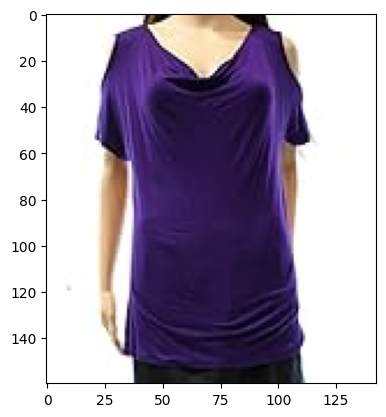

Product Title:  cielo womens large cowl neck cold shoulder blouse purple l 
ASIN : B074WDF7WN
Brand: CIELO
Euclidean Distance from input image: 42.55823
Amazon Url: www.amzon.com/dp/B074WDF7WN


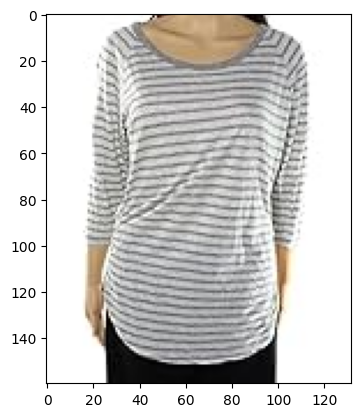

Product Title:  standard james perse white womens large striped blouse gray l 
ASIN : B074TWN3X7
Brand: Standard James Perse
Euclidean Distance from input image: 42.65312
Amazon Url: www.amzon.com/dp/B074TWN3X7


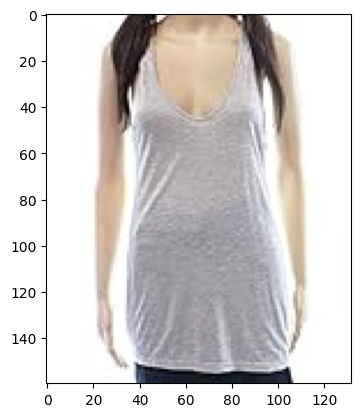

Product Title:  feel piece womens large ml uneck tank cami top gray l 
ASIN : B071G16FZL
Brand: Feel The Piece
Euclidean Distance from input image: 42.85636
Amazon Url: www.amzon.com/dp/B071G16FZL


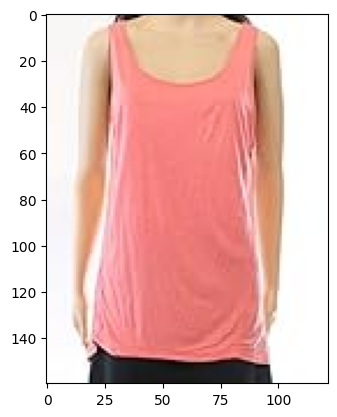

Product Title:  h bordeaux coral womens medium tank top cami pink 
ASIN : B071ZSHMPC
Brand: H By Bordeaux
Euclidean Distance from input image: 42.87506
Amazon Url: www.amzon.com/dp/B071ZSHMPC


In [131]:
recommendation = Deep_Learning_VGG16()
recommendation.get_similar_products_cnn('0000000060', 10)

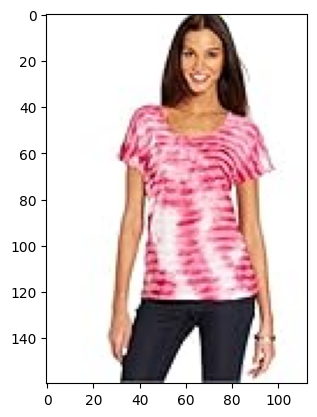

Product Title:  jm collection ribbon textured printed tee pink pinata 
ASIN : B0014DLE5C
Brand: Tasso Elba
Euclidean Distance from input image: 8.31394e-06
Amazon Url: www.amzon.com/dp/B0014DLE5C


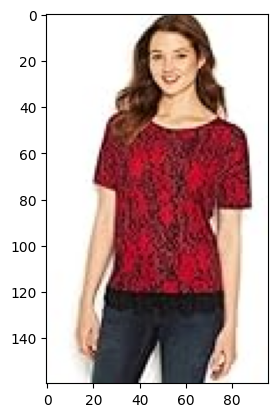

Product Title:  pieces womens lace trimmed print top rouge combo small 
ASIN : B06XCZLCXP
Brand: Pieces
Euclidean Distance from input image: 43.486053
Amazon Url: www.amzon.com/dp/B06XCZLCXP
Product URL is not working
Product URL is not working


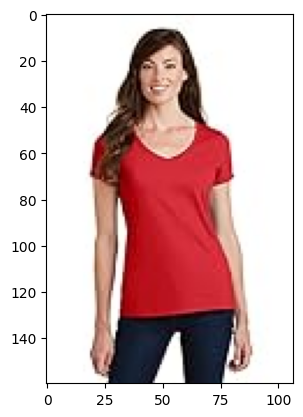

Product Title:  port  company womens fan favorite vneck tee lpc450v bright red 
ASIN : B01GT4CQ6G
Brand: Port & Company
Euclidean Distance from input image: 45.782177
Amazon Url: www.amzon.com/dp/B01GT4CQ6G


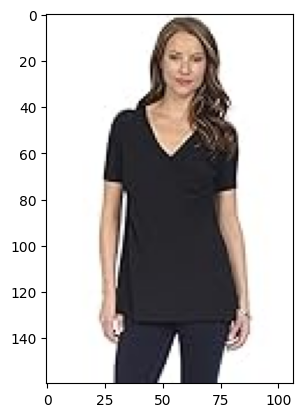

Product Title:  lyss plus womens damaris top black 1x 
ASIN : B00KZEJLT2
Brand: Lyss?? Plus
Euclidean Distance from input image: 46.306038
Amazon Url: www.amzon.com/dp/B00KZEJLT2


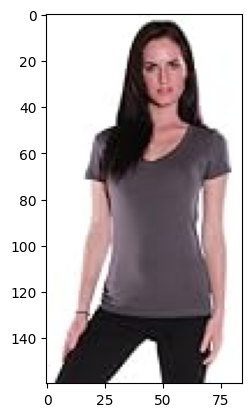

Product Title:  womens basic short sleeve vneck tee shirt cotton blend  junior plus sizes charcoal small 
ASIN : B00JPT2PRS
Brand: Hollywood Star Fashion
Euclidean Distance from input image: 46.335236
Amazon Url: www.amzon.com/dp/B00JPT2PRS


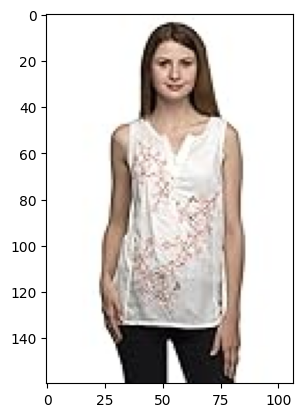

Product Title:  one femme womens floral embroidery summer top  blouse 
ASIN : B01GHGLQU8
Brand: One Femme
Euclidean Distance from input image: 46.352047
Amazon Url: www.amzon.com/dp/B01GHGLQU8


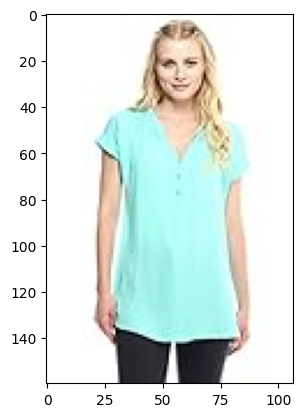

Product Title:  vitamina usa rolled sleeve blouse st6140d mint 
ASIN : B0145FH7ZQ
Brand: Vitamina USA
Euclidean Distance from input image: 46.6392
Amazon Url: www.amzon.com/dp/B0145FH7ZQ


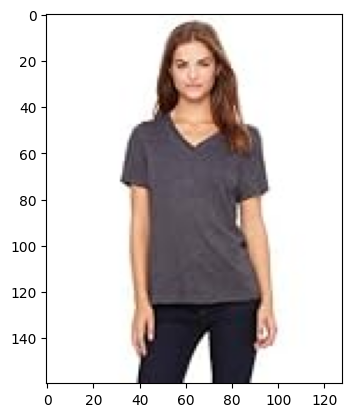

Product Title:  bellacanvas missy shortsleeve jersey vneck tee  dark grey heather 5050  xl 
ASIN : B007P86JW8
Brand: Bodek And Rhodes
Euclidean Distance from input image: 46.871395
Amazon Url: www.amzon.com/dp/B007P86JW8


In [136]:
recommendation = Deep_Learning_VGG16()
recommendation.get_similar_products_cnn('B075CG1KY3', 10)